<a href="https://colab.research.google.com/github/orcacaor/aiffel_quest/blob/main/20251231_comp_reg_colab.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# 오늘은 코드에 하나하나 주석을 쓸 시간이 없어서
# 노션에 발표자료를 만들었습니다
# 이 코드를 직접 읽기보다는 (애초에 요구사항 충족을 위한 제출용 코드 모음이라 가치도 떨어집니다)
# 제가 노션에 간단히 만든 자료를 이용한 발표를 봐주시면 감사드리겠습니다

In [2]:
# 요구사항

# - 데이터 이해 및 탐색 : SalePrice와 주요 변수들의 분포를 시각화를 통해서 파악했는가? (완료)
# - 데이터 전처리 과정 : 결측치 및 이상치를 처리하고 스케일링 및 인코딩을 적절히 수행했는가? (완료)
# - 모델 선택 및 비교 : 3개 이상의 모델을 학습시키고 성능 비교했는가? (완료. 여긴 일부만 있지만 무수히 많이 함)
# - 여러 모델을 앙상블을 통해 결합하여 성능을 비교했는가? (완료)
# - Ridge/Lasso 등의 규제 추가, 트리 기반 모델의 깊이/학습률 등을 조정하여 성능 향상을 시도했는가? (완료)

In [3]:
# 1. 라이브러리 설치
# -q: 로그를 최소화하여 출력 (quiet mode)
!pip install -q autogluon
!pip install -q xgboost lightgbm catboost
!pip install -q optuna optuna-integration

# --upgrade (또는 -U) 옵션을 붙여서 최신 버전으로 갱신
!pip install --upgrade autogluon
!pip install --upgrade xgboost lightgbm catboost
!pip install --upgrade optuna optuna-integration

print("설치가 완료되었습니다. 런타임 재시작이 필요할 수 있습니다.")

import autogluon.core
import xgboost as xgb
import lightgbm as lgb
import catboost as cb
import optuna
import optuna_integration

print(f"AutoGluon Version: {autogluon.core.__version__}")
print(f"XGBoost Version: {xgb.__version__}")
print(f"LightGBM Version: {lgb.__version__}")
print(f"CatBoost Version: {cb.__version__}")
print(f"Optuna Version: {optuna.__version__}")
# optuna_integration은 별도의 __version__ 속성이 없을 수 있으므로 패키지 정보로 확인하거나 임포트 성공 여부로 판단합니다.
try:
    from importlib.metadata import version
    print(f"Optuna Integration Version: {version('optuna-integration')}")
except ImportError:
    print("Optuna Integration installed (version lookup failed)")



설치가 완료되었습니다. 런타임 재시작이 필요할 수 있습니다.
AutoGluon Version: 1.5.0
XGBoost Version: 3.1.2
LightGBM Version: 4.6.0
CatBoost Version: 1.2.8
Optuna Version: 4.6.0
Optuna Integration Version: 4.6.0


In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


import warnings

warnings.filterwarnings('ignore')

# 모든 열(Column) 출력
pd.set_option('display.max_columns', None)

# 모든 행(Row) 출력
# pd.set_option('display.max_rows', None)

# 행 설정 초기화
# pd.reset_option('display.max_rows')



In [5]:
train = pd.read_csv('train.csv')
test = pd.read_csv('test.csv')
submission = pd.read_csv('sample_submission.csv')

In [6]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1168 entries, 0 to 1167
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1168 non-null   int64  
 1   MSSubClass     1168 non-null   int64  
 2   MSZoning       1168 non-null   object 
 3   LotFrontage    950 non-null    float64
 4   LotArea        1168 non-null   int64  
 5   Street         1168 non-null   object 
 6   Alley          70 non-null     object 
 7   LotShape       1168 non-null   object 
 8   LandContour    1168 non-null   object 
 9   Utilities      1168 non-null   object 
 10  LotConfig      1168 non-null   object 
 11  LandSlope      1168 non-null   object 
 12  Neighborhood   1168 non-null   object 
 13  Condition1     1168 non-null   object 
 14  Condition2     1168 non-null   object 
 15  BldgType       1168 non-null   object 
 16  HouseStyle     1168 non-null   object 
 17  OverallQual    1168 non-null   int64  
 18  OverallC

In [7]:
train.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,968,20,RL,NaN,7390,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,5,7,1955,1955,Hip,CompShg,Wd Sdng,Wd Sdng,BrkFace,151.0,TA,TA,CBlock,TA,TA,No,ALQ,902,Unf,0,196,1098,GasA,TA,Y,SBrkr,1098,0,0,1098,1,0,1,0,3,1,TA,6,Typ,0,NaN,Attchd,1955.0,Unf,1,260,TA,TA,Y,0,0,0,0,0,0,NaN,NaN,NaN,0,7,2008,WD,Normal,135000
1,739,90,RL,60.0,10800,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Edwards,Norm,Norm,Duplex,1Story,5,5,1987,1988,Gable,CompShg,Plywood,Plywood,NaN,0.0,TA,TA,CBlock,Gd,Gd,Gd,GLQ,1200,Unf,0,0,1200,GasA,TA,Y,SBrkr,1200,0,0,1200,3,0,3,0,3,1,TA,5,Typ,0,NaN,NaN,NaN,NaN,0,0,NaN,NaN,Y,120,0,0,0,0,0,NaN,NaN,NaN,0,3,2009,WD,Alloca,179000
2,696,20,RL,54.0,13811,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Timber,Norm,Norm,1Fam,1Story,6,6,1987,1987,Gable,CompShg,HdBoard,HdBoard,BrkFace,72.0,TA,TA,CBlock,Gd,Gd,No,GLQ,980,LwQ,40,92,1112,GasA,Gd,Y,SBrkr,1137,0,0,1137,1,0,2,0,2,1,Gd,5,Typ,1,TA,Attchd,1987.0,Unf,2,551,TA,TA,Y,125,0,0,0,0,0,NaN,NaN,NaN,0,7,2006,WD,Normal,176000
3,239,20,RL,93.0,12030,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NridgHt,Norm,Norm,1Fam,1Story,8,5,2007,2007,Hip,CompShg,VinylSd,VinylSd,BrkFace,254.0,Ex,TA,PConc,Ex,TA,No,Unf,0,Unf,0,1694,1694,GasA,Ex,Y,SBrkr,1694,0,0,1694,0,0,2,0,3,1,Gd,7,Typ,0,NaN,Attchd,2007.0,Fin,3,818,TA,TA,Y,168,228,0,0,0,0,NaN,NaN,NaN,0,12,2007,New,Partial,318000
4,891,50,RL,60.0,8064,Pave,NaN,Reg,Lvl,AllPub,Corner,Gtl,NAmes,Artery,Norm,1Fam,1.5Fin,5,7,1949,2006,Gable,CompShg,MetalSd,MetalSd,NaN,0.0,TA,Gd,CBlock,TA,TA,Mn,Unf,0,Unf,0,672,672,GasA,Ex,Y,SBrkr,672,252,0,924,0,0,1,0,3,1,TA,6,Typ,1,Po,Detchd,2003.0,Unf,2,576,TA,TA,Y,0,0,0,0,0,0,NaN,MnPrv,Shed,2000,7,2007,WD,Normal,122900


In [8]:
train.duplicated().sum()

np.int64(0)

In [9]:
train.drop(columns='Id', inplace=True)
test.drop(columns='Id', inplace=True)

train.duplicated().sum()

np.int64(0)

In [10]:
train_check = pd.concat([train.dtypes, train.nunique(), train.isnull().sum(), (train.isnull().sum() / len(train)) * 100], axis=1)
train_check.columns = ['dtype', 'nunique', 'null', 'null_ratio']


# 모든 행(Row) 출력
pd.set_option('display.max_rows', None)

display(train_check.sort_values(by=['dtype', 'nunique'], ascending=True))

# 행 설정 초기화
pd.reset_option('display.max_rows')

,dtype,nunique,null,null_ratio
BsmtHalfBath,int64,3,0,0.000000
HalfBath,int64,3,0,0.000000
BsmtFullBath,int64,4,0,0.000000
FullBath,int64,4,0,0.000000
KitchenAbvGr,int64,4,0,0.000000
Fireplaces,int64,4,0,0.000000
GarageCars,int64,5,0,0.000000
YrSold,int64,5,0,0.000000
PoolArea,int64,7,0,0.000000
BedroomAbvGr,int64,8,0,0.000000


In [11]:
# 타깃 로그 변환 ㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡ

np.float64(1.957766064521197)

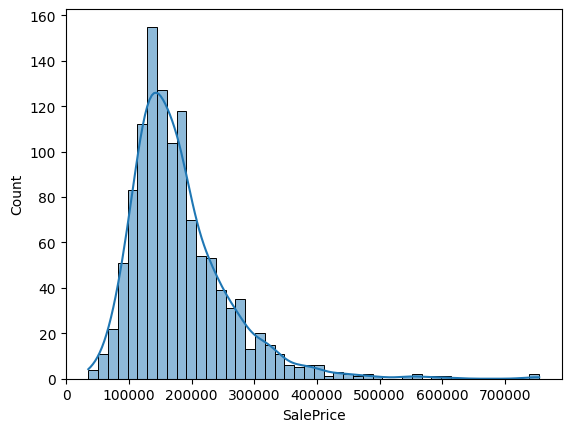

In [12]:


sns.histplot(train['SalePrice'], kde=True)
train['SalePrice'].skew()


<Axes: xlabel='SalePrice_log', ylabel='Count'>

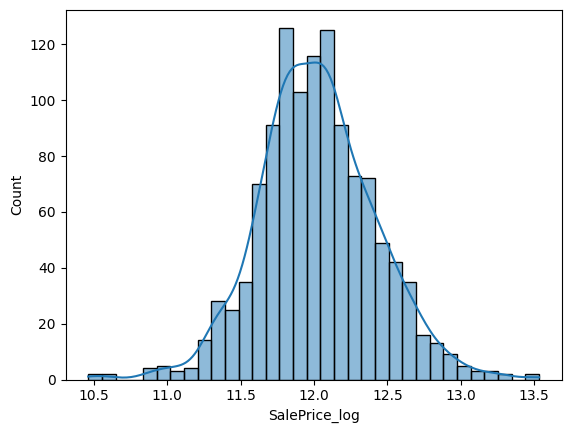

In [13]:

train['SalePrice_log'] = np.log1p(train['SalePrice'])
train.drop(columns='SalePrice', inplace=True)

sns.histplot(train['SalePrice_log'], kde=True)

In [14]:
# 이상치 처리 ㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡ

In [15]:
train.describe()

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice_log
count,1168.00000,950.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1160.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1099.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000
mean,56.97774,70.058947,10336.357877,6.105308,5.595890,1971.201199,1985.021404,102.938793,442.928938,42.537671,574.708904,1060.175514,1161.748288,344.853596,5.094178,1511.696062,0.425514,0.058219,1.562500,0.388699,2.865582,1.047089,6.511130,0.625856,1978.404914,1.761130,469.888699,90.971747,47.554795,22.715753,3.219178,16.332192,2.955479,51.279110,6.306507,2007.830479,12.020568
std,42.29068,24.762405,8784.854640,1.373032,1.127388,30.362445,20.693264,176.142597,462.364719,151.670697,440.959454,439.223929,392.662227,438.502580,44.876004,535.707765,0.518319,0.241463,0.551882,0.506624,0.824796,0.223722,1.639763,0.654232,24.988391,0.746517,213.604836,123.811685,68.250085,63.042971,29.241246,58.828037,41.648504,552.357575,2.715955,1.323583,0.398863
min,20.00000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,0.000000,0.000000,0.000000,334.000000,0.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,1908.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,10.460271
25%,20.00000,59.000000,7560.000000,5.000000,5.000000,1954.000000,1966.750000,0.000000,0.000000,0.000000,233.000000,793.000000,880.000000,0.000000,0.000000,1126.000000,0.000000,0.000000,1.000000,0.000000,2.000000,1.000000,5.000000,0.000000,1962.000000,1.000000,336.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,11.771444
50%,50.00000,69.000000,9446.000000,6.000000,5.000000,1972.500000,1994.000000,0.000000,374.500000,0.000000,485.500000,990.000000,1077.500000,0.000000,0.000000,1456.000000,0.000000,0.000000,2.000000,0.000000,3.000000,1.000000,6.000000,1.000000,1980.000000,2.000000,477.500000,0.000000,25.500000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,12.007597
75%,70.00000,80.000000,11601.500000,7.000000,6.000000,2001.000000,2004.000000,168.000000,714.500000,0.000000,813.250000,1306.000000,1392.500000,728.000000,0.000000,1774.250000,1.000000,0.000000,2.000000,1.000000,3.000000,1.000000,7.000000,1.000000,2002.000000,2.000000,576.000000,165.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,12.269345
max,190.00000,313.000000,164660.000000,10.000000,9.000000,2010.000000,2010.000000,1170.000000,5644.000000,1474.000000,2153.000000,6110.000000,4692.000000,2065.000000,572.000000,5642.000000,3.000000,2.000000,3.000000,2.000000,8.000000,3.000000,14.000000,3.000000,2010.000000,4.000000,1418.000000,736.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,13.534474


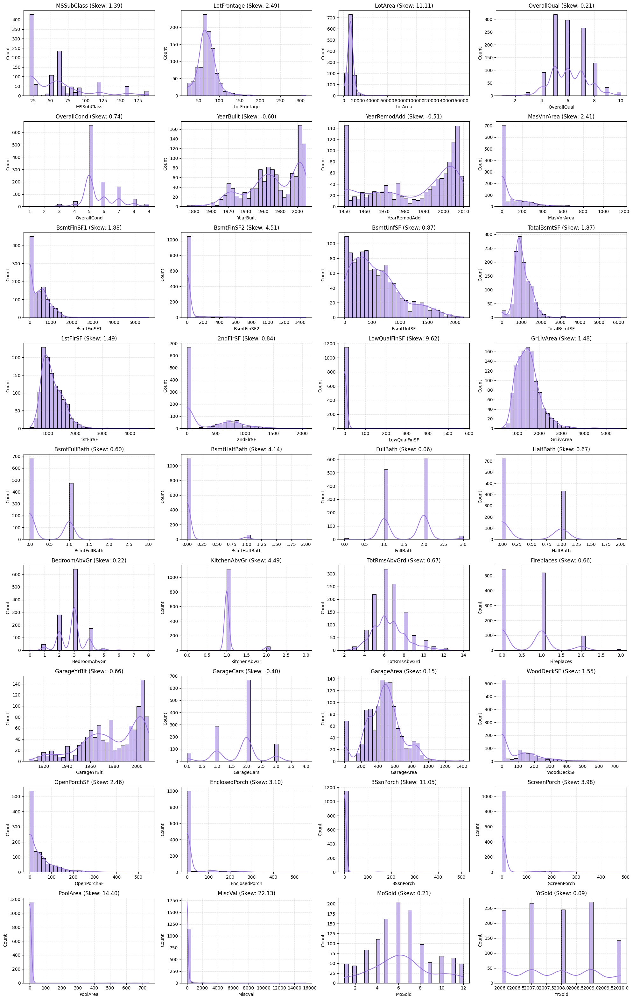

In [16]:
# 히스토그램


# 1. 수치형 컬럼만 자동 수집 (Id 제외, Target 포함 여부는 선택)
# 보통 타깃(SalePrice)의 분포도 같이 보는 게 좋아서 포함시키는 경우가 많음
numeric_cols = train.select_dtypes(include=['number']).columns
numeric_cols = [col for col in numeric_cols if col not in ['SalePrice_log', 'Id']]

# 2. 서브플롯 그리드 크기 계산
cols_per_row = 4
rows = (len(numeric_cols) - 1) // cols_per_row + 1

# 3. 전체 캔버스 크기 설정
plt.figure(figsize=(20, rows * 3.5))

# 4. 반복문으로 그리기
for i, feature in enumerate(numeric_cols):
    plt.subplot(rows, cols_per_row, i + 1)

    # histplot: 히스토그램 + 밀도 곡선(kde=True)
    sns.histplot(train[feature], kde=True, bins=30, color='mediumpurple', edgecolor='black')

    # 왜도(Skewness) 수치를 제목에 표시하면 더 유용함
    skewness = train[feature].skew()
    plt.title(f'{feature} (Skew: {skewness:.2f})')
    plt.grid(True, linestyle='--', alpha=0.3)

plt.tight_layout()
plt.show()


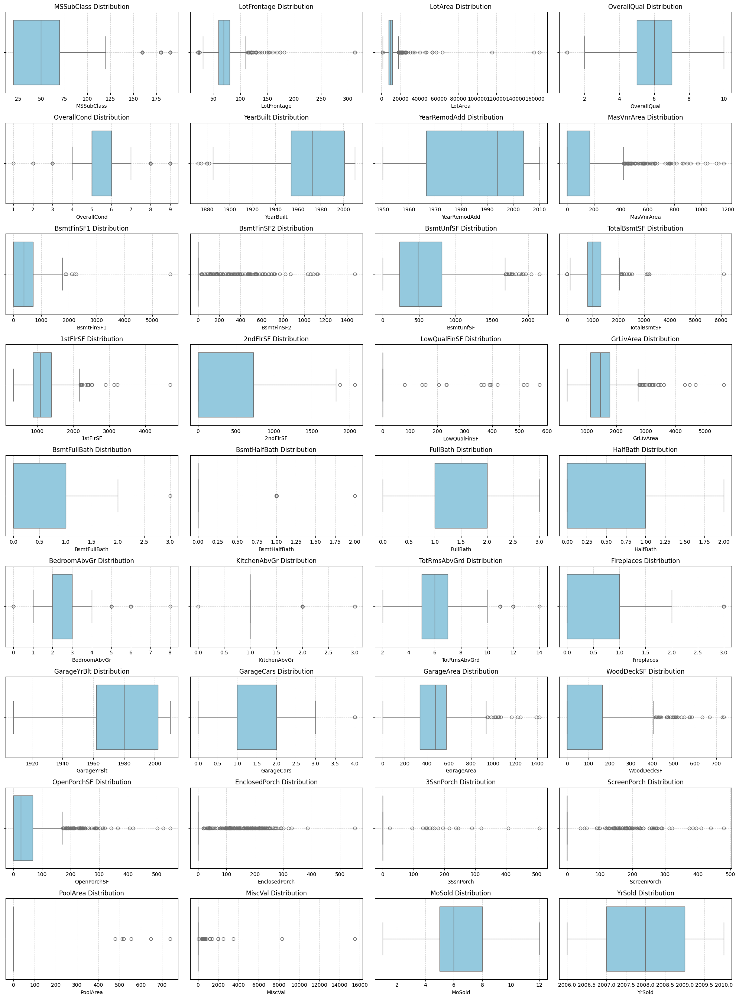

In [17]:
# 박스플롯


# 1. 수치형 컬럼만 자동 수집
numeric_cols = train.select_dtypes(include=['number']).columns
numeric_cols = [col for col in numeric_cols if col not in ['Id', 'SalePrice', 'SalePrice_log']]

# 2. 서브플롯 그리드 크기 계산
cols_per_row = 4
rows = (len(numeric_cols) - 1) // cols_per_row + 1

# 3. 전체 캔버스 크기 설정 (박스플롯은 세로 폭이 좁아도 되므로 rows * 3으로 조정)
plt.figure(figsize=(20, rows * 3))

# 4. 반복문으로 그리기
for i, feature in enumerate(numeric_cols):
    plt.subplot(rows, cols_per_row, i + 1)

    # boxplot: 단변량 이상치 확인 (가로 방향 추천)
    sns.boxplot(x=train[feature], color='skyblue')

    plt.title(f'{feature} Distribution')
    plt.grid(True, linestyle='--', alpha=0.5)

plt.tight_layout()
plt.show()


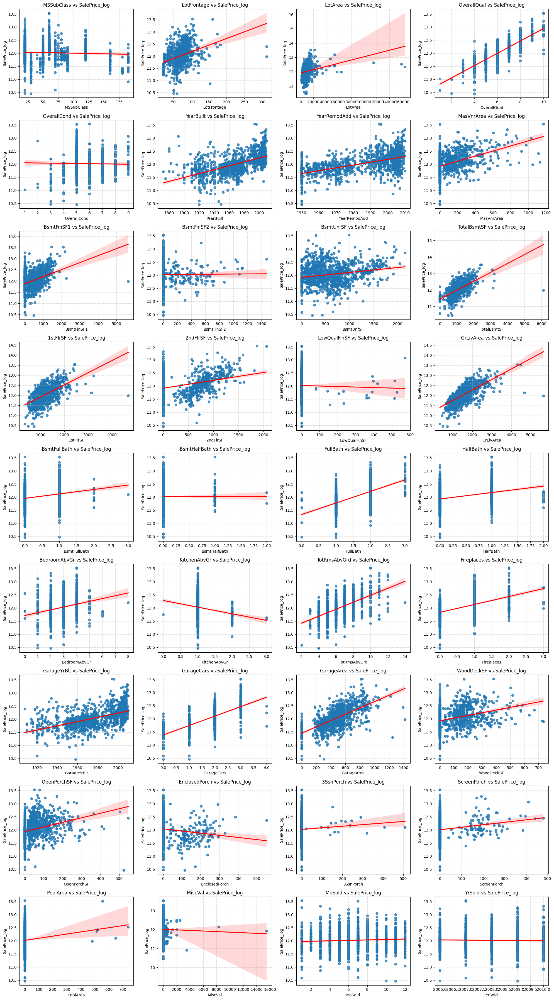

In [18]:
## 산점도 + 회귀선


# 1. 수치형 컬럼만 자동 수집 (Id와 SalePrice_log 제외)
numeric_cols = train.select_dtypes(include=['number']).columns
numeric_cols = [col for col in numeric_cols if col not in ['Id', 'SalePrice', 'SalePrice_log']]

# 2. 서브플롯 그리드 크기 계산
cols_per_row = 4
rows = (len(numeric_cols) - 1) // cols_per_row + 1

# 3. 전체 캔버스 크기 설정
plt.figure(figsize=(20, rows * 4))

# 4. 반복문으로 그리기
for i, feature in enumerate(numeric_cols):
    plt.subplot(rows, cols_per_row, i + 1)

    # regplot: 산점도 + 선형 회귀선
    sns.regplot(
        data=train,
        x=feature,
        y='SalePrice_log',
        # scatter_kws={'alpha': 0.3, 's': 10}, # 점: 투명도 0.3, 크기 10
        line_kws={'color': 'red'}            # 선: 빨간색
    )

    plt.title(f'{feature} vs SalePrice_log')
    plt.grid(True, linestyle='--', alpha=0.5)

plt.tight_layout()
plt.show()


In [19]:

# GrLivArea: 크기는 큰데(4000 이상) 가격은 싼(로그 12.5 미만) 매물
outlier_grliv = train[(train['GrLivArea'] > 4000) & (train['SalePrice_log'] < 12.5)].index
train = train.drop(outlier_grliv)

# 지하실이 비정상적으로 큰 경우
train = train.drop(train[train['TotalBsmtSF'] > 6000].index)

# 1층 면적이 비정상적으로 큰 경우
train = train.drop(train[train['1stFlrSF'] > 4000].index)

# LotFrontage (300 초과)
train = train.drop(train[train['LotFrontage'] > 300].index)

# LotArea (100,000 초과)
train = train.drop(train[train['LotArea'] > 100000].index)

# EnclosedPorch (500 초과)
# train = train.drop(train[train['EnclosedPorch'] > 500].index) # 놔두는게 RMSE 더 좋음;;;

# 인덱스 초기화
train = train.reset_index(drop=True)

print("이상치 처리 및 오타 수정 완료.")

이상치 처리 및 오타 수정 완료.


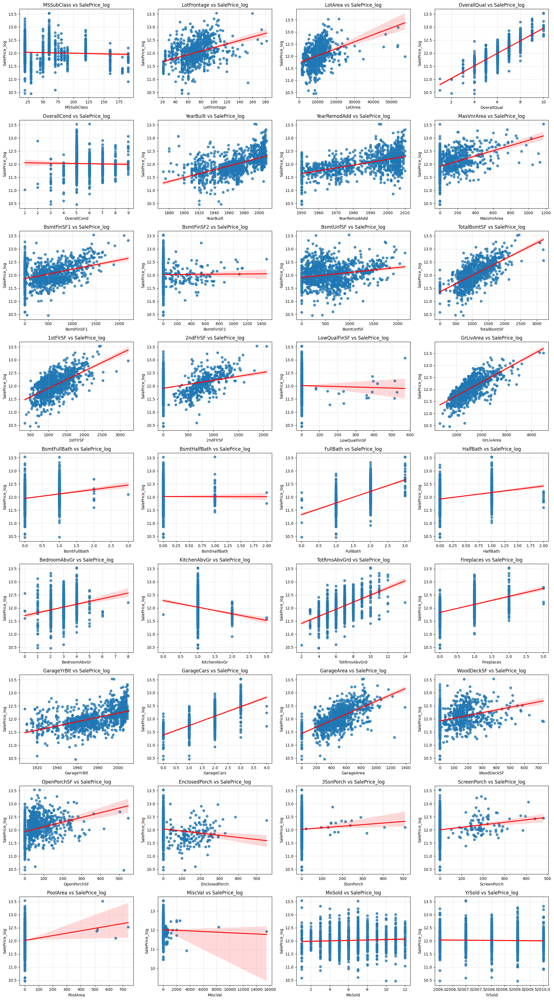

In [20]:
## 산점도 + 회귀선


# 1. 수치형 컬럼만 자동 수집 (Id와 SalePrice_log 제외)
numeric_cols = train.select_dtypes(include=['number']).columns
numeric_cols = [col for col in numeric_cols if col not in ['Id', 'SalePrice', 'SalePrice_log']]

# 2. 서브플롯 그리드 크기 계산
cols_per_row = 4
rows = (len(numeric_cols) - 1) // cols_per_row + 1

# 3. 전체 캔버스 크기 설정
plt.figure(figsize=(20, rows * 4))

# 4. 반복문으로 그리기
for i, feature in enumerate(numeric_cols):
    plt.subplot(rows, cols_per_row, i + 1)

    # regplot: 산점도 + 선형 회귀선
    sns.regplot(
        data=train,
        x=feature,
        y='SalePrice_log',
        # scatter_kws={'alpha': 0.3, 's': 10}, # 점: 투명도 0.3, 크기 10
        line_kws={'color': 'red'}            # 선: 빨간색
    )

    plt.title(f'{feature} vs SalePrice_log')
    plt.grid(True, linestyle='--', alpha=0.5)

plt.tight_layout()
plt.show()


In [21]:
# 수치형인데 의미는 범주형 ㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡ

In [22]:
# 조회

train[['MSSubClass', 'MoSold', 'YrSold']].head(20)

,MSSubClass,MoSold,YrSold
0,20,7,2008
1,90,3,2009
2,20,7,2006
3,20,12,2007
4,50,7,2007
5,120,8,2007
6,50,10,2006
7,60,10,2009
8,20,5,2009
9,60,8,2008


In [23]:
# 범주형으로 취급할 수치형 변수들 -> 문자열(Object)로 변환
cols_to_cat = ['MSSubClass', 'MoSold', 'YrSold']

for c in cols_to_cat:
    train[c] = train[c].astype(str)
    test[c]  = test[c].astype(str)

# 실제 데이터형(dtype)을 추출하여 출력
print("--- 변환 완료 후 데이터 타입 확인 ---")
print(train[cols_to_cat].dtypes)

--- 변환 완료 후 데이터 타입 확인 ---
MSSubClass    object
MoSold        object
YrSold        object
dtype: object


In [24]:
# 결측치 처리 ㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡ

In [25]:
# 모든 행(Row) 출력
pd.set_option('display.max_rows', None)

print('train 결측 비율')
display(((train.isnull().sum() / len(train)) * 100).sort_values(ascending=False))
print('test 결측 비율')
display(((test.isnull().sum() / len(train)) * 100).sort_values(ascending=False))

# 행 설정 초기화
pd.reset_option('display.max_rows')


train 결측 비율


,0
PoolQC,99.569707
MiscFeature,96.041308
Alley,93.975904
Fence,80.464716
MasVnrType,59.552496
FireplaceQu,46.901893
LotFrontage,18.502582
GarageQual,5.938038
GarageType,5.938038
GarageFinish,5.938038


test 결측 비율


,0
PoolQC,25.043029
MiscFeature,24.612737
Alley,23.321859
Fence,20.481928
MasVnrType,15.318417
FireplaceQu,12.478485
LotFrontage,3.528399
BsmtExposure,1.204819
BsmtQual,1.204819
BsmtCond,1.204819


In [26]:
train_check = pd.concat([train.dtypes, train.nunique(), train.isnull().sum(), (train.isnull().sum() / len(train)) * 100], axis=1)
train_check.columns = ['dtype', 'nunique', 'null', 'null_ratio']


# 모든 행(Row) 출력
pd.set_option('display.max_rows', None)

display(train_check.sort_values(by=['dtype', 'null_ratio'], ascending=False))

# 행 설정 초기화
pd.reset_option('display.max_rows')

,dtype,nunique,null,null_ratio
PoolQC,object,3,1157,99.569707
MiscFeature,object,4,1116,96.041308
Alley,object,2,1092,93.975904
Fence,object,4,935,80.464716
MasVnrType,object,3,692,59.552496
FireplaceQu,object,5,545,46.901893
GarageType,object,6,69,5.938038
GarageFinish,object,3,69,5.938038
GarageQual,object,5,69,5.938038
GarageCond,object,4,69,5.938038


In [27]:
# 1. "NA = 시설 없음" (의미 있는 결측)
# 가장 많은 컬럼이 해당. 데이터 설명서를 보면 NA는 데이터가 빈 게 아니라 "집에 그 시설이 없다"는 뜻.

# 해당 컬럼:
# PoolQC (수영장 없음)
# MiscFeature (기타 시설 없음)
# Alley (골목 접근로 없음)
# Fence (울타리 없음)
# FireplaceQu (벽난로 없음)
# Garage 그룹: GarageType, GarageFinish, GarageQual, GarageCond (차고 없음)
# Basement 그룹: BsmtQual, BsmtCond, BsmtExposure, BsmtFinType1, BsmtFinType2 (지하실 없음)

cols_fill_none = [
    'PoolQC', 'MiscFeature', 'Alley', 'Fence', 'FireplaceQu',
    'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond',
    'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2',
    'MasVnrType' # 벽돌 마감이 없으면 None
]

for col in cols_fill_none:
    train[col] = train[col].fillna('None')
    test[col] = test[col].fillna('None')

In [28]:
# 2. LotFrontage (도로와 맞닿은 거리)
# 상태: 약 18% 결측. 집이 도로와 맞닿은 선의 길이입니다.
# 특징: 물리적으로 이 값이 없을 수는 없습니다. 진짜로 누락된 데이터입니다.

# Neighborhood별 LotFrontage의 중앙값으로 결측치 채우기
train['LotFrontage'] = train.groupby('Neighborhood')['LotFrontage'].transform(
    lambda x: x.fillna(x.median())
)

# ---------------------------------------------------------
# 1. LotFrontage 처리 (Train의 동네별 중앙값 기준)
# ---------------------------------------------------------
# (1) Train 데이터에서 '동네별 LotFrontage 중앙값'을 미리 계산하여 딕셔너리(Map)로 만듭니다.
lotfrontage_map = train.groupby('Neighborhood')['LotFrontage'].median()

# (2) Test 데이터의 Neighborhood에 맞춰서 매핑된 중앙값을 채웁니다.
test['LotFrontage'] = test['LotFrontage'].fillna(test['Neighborhood'].map(lotfrontage_map))

# (혹시나 Test에만 있는 새로운 동네가 있어서 여전히 결측치인 경우를 대비해, 전체 중앙값으로 한 번 더 땜빵)
test['LotFrontage'] = test['LotFrontage'].fillna(train['LotFrontage'].median())

In [29]:
# 3. GarageYrBlt (차고 건축 연도)
# 상태: 약 5.9% 결측. 차고가 없는 집들입니다.
# 문제점: 수치형 변수인데 'None'으로 채울 수 없습니다. 0으로 채우자니 연도 데이터라 왜곡(2000년과 0년의 차이)이 너무 큽니다.

# 방법 1: 0으로 채우기 (트리 모델용)
train['GarageYrBlt'] = train['GarageYrBlt'].fillna(0)
test['GarageYrBlt'] = test['GarageYrBlt'].fillna(0)

In [30]:
# 5. Electrical (전기 시설)
# 상태: 1개 결측 (극소수).
# 특징: 집인데 전기가 없을 확률은 낮습니다. 단순 누락입니다.
# 🔴 상위권 처리 방법:
# **최빈값(Mode)**으로 채웁니다. 이 데이터셋의 대부분은 SBrkr (Standard Circuit Breakers)입니다.
# code
# Python
train['Electrical'] = train['Electrical'].fillna(train['Electrical'].mode()[0])

# ---------------------------------------------------------
# 2. Electrical 처리 (Train의 최빈값 기준)
# ---------------------------------------------------------
# Train에서 구했던 최빈값을 변수에 저장해서 사용하거나, 직접 참조합니다.
train_electrical_mode = train['Electrical'].mode()[0]

test['Electrical'] = test['Electrical'].fillna(train_electrical_mode)

print("Test 결측치 처리 완료")

Test 결측치 처리 완료


In [31]:
train[['MasVnrType', 'MasVnrArea']]

,MasVnrType,MasVnrArea
0,BrkFace,151.0
1,None,0.0
2,BrkFace,72.0
3,BrkFace,254.0
4,None,0.0
...,...,...
1157,None,0.0
1158,None,0.0
1159,BrkFace,479.0
1160,BrkFace,472.0


In [32]:
# 1. MasVnrArea(면적) 결측치는 0으로 먼저 채웁니다.
train['MasVnrArea'] = train['MasVnrArea'].fillna(0)

# 2. [논리 1] 면적이 0인데 타입이 NaN인 경우 -> 'None'으로 채움
# (벽돌이 없으니 타입도 없음)
mask_no_area = (train['MasVnrArea'] == 0) & (train['MasVnrType'].isna())
train.loc[mask_no_area, 'MasVnrType'] = 'None'

# 3. [논리 2] 면적이 0보다 큰데(존재하는데) 타입이 NaN인 경우 -> '최빈값'으로 채움
# (None을 제외한 재질 중 가장 많이 쓰이는 것, 보통 BrkFace가 나옵니다)
# 최빈값 구하기 (None 제외)
most_freq_masvnr = train.loc[train['MasVnrType'] != 'None', 'MasVnrType'].mode()[0]

# 나머지 결측치(면적은 있는데 타입이 빈 것들)를 최빈값으로 채움
train['MasVnrType'] = train['MasVnrType'].fillna(most_freq_masvnr)

# 확인용 출력
print(f"채워진 최빈값 재질: {most_freq_masvnr}")
print(train[['MasVnrType', 'MasVnrArea']].isnull().sum())

채워진 최빈값 재질: BrkFace
MasVnrType    0
MasVnrArea    0
dtype: int64


In [33]:
# 1. Test 데이터의 MasVnrArea 결측치도 0으로 채움 (Train과 동일한 기준)
test['MasVnrArea'] = test['MasVnrArea'].fillna(0)

# 2. [논리 1] 면적이 0인데 타입이 NaN인 경우 -> 'None'으로 채움
mask_no_area_test = (test['MasVnrArea'] == 0) & (test['MasVnrType'].isna())
test.loc[mask_no_area_test, 'MasVnrType'] = 'None'

# 3. [논리 2] 나머지 결측치(면적 > 0 이지만 타입이 빈 경우)
# ★중요★: 여기서 최빈값을 다시 구하지 않고, Train에서 구했던 'most_freq_masvnr' 변수를 그대로 씁니다.
test['MasVnrType'] = test['MasVnrType'].fillna(most_freq_masvnr)

# 확인용 출력
print("Test 데이터 MasVnr 처리 완료")
print(test[['MasVnrType', 'MasVnrArea']].isnull().sum())

Test 데이터 MasVnr 처리 완료
MasVnrType    0
MasVnrArea    0
dtype: int64


In [34]:
# 모든 행(Row) 출력
pd.set_option('display.max_rows', None)

print('train 결측 비율')
display(((train.isnull().sum() / len(train)) * 100).sort_values(ascending=False))
print('test 결측 비율')
display(((test.isnull().sum() / len(train)) * 100).sort_values(ascending=False))

# 행 설정 초기화
pd.reset_option('display.max_rows')


train 결측 비율


,0
MSSubClass,0.0
MSZoning,0.0
LotFrontage,0.0
LotArea,0.0
Street,0.0
Alley,0.0
LotShape,0.0
LandContour,0.0
Utilities,0.0
LotConfig,0.0


test 결측 비율


,0
MSSubClass,0.0
MSZoning,0.0
LotFrontage,0.0
LotArea,0.0
Street,0.0
Alley,0.0
LotShape,0.0
LandContour,0.0
Utilities,0.0
LotConfig,0.0


In [35]:
# 범주형 -> 수치형 ㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡ

In [36]:
def map_ordinal_features(df):
    df = df.copy()

    # 1. 일반적인 품질 평가 (Ex -> 5 ~ Po -> 1, None -> 0)
    # NA나 None은 이미 전처리 단계에서 'None' 문자열로 채워졌다고 가정
    qual_map = {'Ex': 5, 'Gd': 4, 'TA': 3, 'Fa': 2, 'Po': 1, 'None': 0, 'NA': 0}

    qual_cols = [
        'ExterQual', 'ExterCond', 'BsmtQual', 'BsmtCond',
        'HeatingQC', 'KitchenQual', 'FireplaceQu',
        'GarageQual', 'GarageCond', 'PoolQC'
    ]

    for col in qual_cols:
        # 혹시 모를 결측치는 'None'으로 간주하고 0 처리 (map은 없는 키값은 NaN 반환하므로 주의)
        # 따라서 안전하게 replace나 map 후 fillna(0) 사용
        if col in df.columns:
            df[col] = df[col].map(qual_map).fillna(0).astype(int)

    # 2. 지하실 노출 (Gd > Av > Mn > No > None)
    bsmt_exposure_map = {'Gd': 4, 'Av': 3, 'Mn': 2, 'No': 1, 'None': 0, 'NA': 0}
    if 'BsmtExposure' in df.columns:
        df['BsmtExposure'] = df['BsmtExposure'].map(bsmt_exposure_map).fillna(0).astype(int)

    # 3. 지하실 마감 (GLQ > ... > Unf > None)
    bsmt_fin_map = {
        'GLQ': 6, 'ALQ': 5, 'BLQ': 4,
        'Rec': 3, 'LwQ': 2, 'Unf': 1,
        'None': 0, 'NA': 0
    }
    if 'BsmtFinType1' in df.columns:
        df['BsmtFinType1'] = df['BsmtFinType1'].map(bsmt_fin_map).fillna(0).astype(int)
    if 'BsmtFinType2' in df.columns:
        df['BsmtFinType2'] = df['BsmtFinType2'].map(bsmt_fin_map).fillna(0).astype(int)

    # 4. 기능성 (Typ > ... > Sal)
    functional_map = {
        'Typ': 7, 'Min1': 6, 'Min2': 5, 'Mod': 4,
        'Maj1': 3, 'Maj2': 2, 'Sev': 1, 'Sal': 0,
        'None': 0 # Functional은 보통 결측이 없지만 안전장치
    }
    if 'Functional' in df.columns:
        df['Functional'] = df['Functional'].map(functional_map).fillna(7).astype(int) # 결측은 보통 Typ(7)로 채움

    # 5. 차고 마감 (Fin > RFn > Unf > None)
    garage_fin_map = {'Fin': 3, 'RFn': 2, 'Unf': 1, 'None': 0, 'NA': 0}
    if 'GarageFinish' in df.columns:
        df['GarageFinish'] = df['GarageFinish'].map(garage_fin_map).fillna(0).astype(int)

    # 6. 진입로 포장 (Y > P > N)
    pave_map = {'Y': 2, 'P': 1, 'N': 0}
    if 'PavedDrive' in df.columns:
        df['PavedDrive'] = df['PavedDrive'].map(pave_map).fillna(0).astype(int)

    # 7. 울타리 (Good Privacy > ... > No Fence) - 선택사항이나 하는 게 좋음
    fence_map = {'GdPrv': 4, 'MnPrv': 3, 'GdWo': 2, 'MnWw': 1, 'None': 0, 'NA': 0}
    if 'Fence' in df.columns:
        df['Fence'] = df['Fence'].map(fence_map).fillna(0).astype(int)

    return df

# --- 실행 ---
train = map_ordinal_features(train)
test = map_ordinal_features(test)

print("순서형 변수 수치 매핑 완료!")
# 확인
print(train[['ExterQual', 'BsmtQual', 'KitchenQual']].head())

순서형 변수 수치 매핑 완료!
   ExterQual  BsmtQual  KitchenQual
0          3         3            3
1          3         4            3
2          3         4            4
3          5         5            4
4          3         3            3


In [37]:
# 피처 엔지니어링ㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡ

In [38]:

def add_derived_features(df):
    """
    단일 데이터프레임(df)을 입력받아 파생 변수를 추가하고 반환하는 함수
    (train과 test를 합치지 않고 개별 적용, fillna(0) 강제 적용 없음)
    """
    df = df.copy() # 원본 데이터 보존

    # ====================================================
    # 🏠 1. 공간(Area) 관련 파생 변수
    # ====================================================
    # TotalSF는 원본 코드에서도 각각 fillna(0)을 하고 더했으므로 유지
    df['TotalSF'] = (df['TotalBsmtSF'].fillna(0) +
                     df['1stFlrSF'].fillna(0) +
                     df['2ndFlrSF'].fillna(0))

    df['Total_Home_Quality'] = df['OverallQual'] + df['OverallCond']

    # ====================================================
    # 🛁 2. 욕실(Bathroom) 통합
    # ====================================================
    df['Total_Bathrooms'] = (df['FullBath'].fillna(0) +
                             (0.5 * df['HalfBath'].fillna(0)) +
                             df['BsmtFullBath'].fillna(0) +
                             (0.5 * df['BsmtHalfBath'].fillna(0)))

    # ====================================================
    # 🌳 3. 외부 공간(Porch) 통합
    # ====================================================
    df['Total_Porch_SF'] = (df['OpenPorchSF'].fillna(0) +
                            df['3SsnPorch'].fillna(0) +
                            df['EnclosedPorch'].fillna(0) +
                            df['ScreenPorch'].fillna(0) +
                            df['WoodDeckSF'].fillna(0))

    # ====================================================
    # 📅 4. 시간(Year) 관련
    # ====================================================
    df['YearsSinceRemodel'] = df['YrSold'].astype(int) - df['YearRemodAdd'].astype(int)
    df['AgeAtSale'] = df['YrSold'].astype(int) - df['YearBuilt'].astype(int)

    # ====================================================
    # ✅ 5. 유무(Boolean) 플래그
    # ====================================================
    df['HasPool'] = df['PoolArea'].apply(lambda x: 1 if x > 0 else 0)
    df['Has2ndFloor'] = df['2ndFlrSF'].apply(lambda x: 1 if x > 0 else 0)
    df['HasGarage'] = df['GarageArea'].apply(lambda x: 1 if x > 0 else 0)
    df['HasBsmt'] = df['TotalBsmtSF'].apply(lambda x: 1 if x > 0 else 0)
    df['HasFireplace'] = df['Fireplaces'].apply(lambda x: 1 if x > 0 else 0)

    # ====================================================
    # 🚀 6. 교호작용(Interaction) 변수 (fillna 제거됨)
    # ====================================================

    # TotalSF * OverallQual
    if 'OverallQual' in df.columns and 'TotalSF' in df.columns:
        df['TotalSF_OverallQual'] = df['TotalSF'] * df['OverallQual']

    # 1stFlrSF * OverallQual (fillna 제거)
    if 'OverallQual' in df.columns and '1stFlrSF' in df.columns:
        df['1stFlrSF_OverallQual'] = df['1stFlrSF'] * df['OverallQual']

    # GrLivArea * OverallQual (fillna 제거)
    if 'OverallQual' in df.columns and 'GrLivArea' in df.columns:
        df['GrLivArea_OverallQual'] = df['GrLivArea'] * df['OverallQual']

    # Bath * Qual
    df['Bath_Qual'] = df['Total_Bathrooms'] * df['OverallQual']

    # GarageArea * GarageQual
    # [수정됨] fillna(0) 제거 -> 원본 GarageArea에 NaN이 있으면 결과도 NaN이 됨
    if df['GarageQual'].dtype != 'object':
         df['GarageArea_Qual'] = df['GarageArea'] * df['GarageQual']

    return df

# --- 실행 ---
print(f"변수 생성 전 Train 형태: {train.shape}")
print(f"변수 생성 전 Test 형태: {test.shape}")

# Train과 Test에 각각 함수 적용
train = add_derived_features(train)
test = add_derived_features(test)

print(f"변수 생성 후 Train 형태: {train.shape}")
print(f"변수 생성 후 Test 형태: {test.shape}")

# 확인
print("\n생성된 주요 파생변수 (Train 상위 5행):")
print(train[['TotalSF', 'Total_Bathrooms', 'TotalSF_OverallQual', 'GarageArea_Qual']].head())

변수 생성 전 Train 형태: (1162, 80)
변수 생성 전 Test 형태: (292, 79)
변수 생성 후 Train 형태: (1162, 96)
변수 생성 후 Test 형태: (292, 95)

생성된 주요 파생변수 (Train 상위 5행):
   TotalSF  Total_Bathrooms  TotalSF_OverallQual  GarageArea_Qual
0     2196              2.0                10980              780
1     2400              6.0                12000                0
2     2249              3.0                13494             1653
3     3388              2.0                27104             2454
4     1596              1.0                 7980             1728


In [39]:
# box-cox ㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡ

In [40]:

# 모든 행(Row) 출력
pd.set_option('display.max_rows', None)


# 1. 수치형 컬럼만 선택
numeric_features = train.select_dtypes(include=['number'])

# 2. 각 컬럼별 왜도(Skewness) 계산
# .skew()는 기본적으로 각 컬럼의 왜도를 반환합니다.
skewness = numeric_features.skew()

# 3. 절대값을 기준으로 내림차순 정렬 (왜도가 양수/음수 모두 중요하므로)
# 컬럼명도 함께 보기 위해 DataFrame으로 변환합니다.
skew_df = pd.DataFrame({'Column': skewness.index, 'Skewness': skewness.values})
skew_df['Abs_Skewness'] = skew_df['Skewness'].abs()
skew_sorted = skew_df.sort_values(by='Abs_Skewness', ascending=False).drop(columns=['Abs_Skewness'])

# 결과 확인
print("📊 수치형 변수 왜도(Skewness) 정렬 결과:")
print(skew_sorted.reset_index(drop=True))


# 행 설정 초기화
pd.reset_option('display.max_rows')

📊 수치형 변수 왜도(Skewness) 정렬 결과:
                   Column   Skewness
0                 MiscVal  22.132049
1                  PoolQC  17.609696
2                PoolArea  15.666688
3                 HasPool  15.165683
4               3SsnPorch  11.025829
5            LowQualFinSF   9.595750
6                 HasBsmt  -6.903981
7              Functional  -5.018075
8              BsmtFinSF2   4.504420
9            KitchenAbvGr   4.480900
10           BsmtHalfBath   4.167351
11            ScreenPorch   3.969853
12              HasGarage  -3.733589
13            GarageYrBlt  -3.716658
14               BsmtCond  -3.681483
15                LotArea   3.595504
16           BsmtFinType2   3.484347
17             GarageCond  -3.296148
18             PavedDrive  -3.263404
19             GarageQual  -3.133098
20          EnclosedPorch   3.087724
21             MasVnrArea   2.449959
22            OpenPorchSF   2.438652
23                  Fence   1.778498
24  GrLivArea_OverallQual   1.543861
25       

In [41]:

# 1. 수치형 컬럼만 따로 추출하여 왜도 계산
numeric_cols = train.select_dtypes(include=['number']).columns
skewness = train[numeric_cols].skew()

# 2. 정보 결합 (axis=1로 합치면 자동으로 인덱스(컬럼명) 기준으로 매칭됩니다)
train_check = pd.concat([
    train.dtypes,
    train.nunique(),
    skewness           # 수치형만 계산된 결과 전달

], axis=1)

train_check.columns = ['dtype', 'nunique', 'skew']

# 모든 행(Row) 출력 설정
pd.set_option('display.max_rows', None)

# 정렬 및 출력 (범주형 데이터의 skew는 자동으로 NaN으로 표시됩니다)
display(train_check.sort_values(by=['dtype', 'nunique'], ascending=True))

# 행 설정 초기화
pd.reset_option('display.max_rows')

,dtype,nunique,skew
HasPool,int64,2,15.165683
Has2ndFloor,int64,2,0.303290
HasGarage,int64,2,-3.733589
HasBsmt,int64,2,-6.903981
HasFireplace,int64,2,-0.124323
BsmtHalfBath,int64,3,4.167351
HalfBath,int64,3,0.673821
PavedDrive,int64,3,-3.263404
ExterQual,int64,4,0.796280
BsmtFullBath,int64,4,0.582852


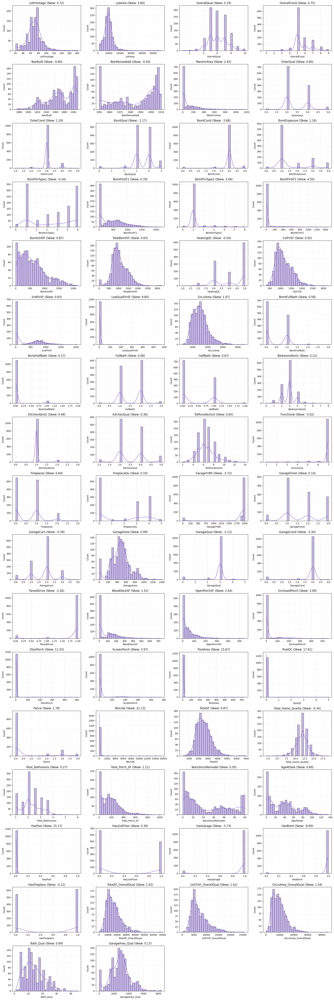

In [42]:
# 히스토그램


# 1. 수치형 컬럼만 자동 수집 (Id 제외, Target 포함 여부는 선택)
# 보통 타깃(SalePrice)의 분포도 같이 보는 게 좋아서 포함시키는 경우가 많음
numeric_cols = train.select_dtypes(include=['number']).columns
numeric_cols = [col for col in numeric_cols if col not in ['SalePrice_log', 'Id']]

# 2. 서브플롯 그리드 크기 계산
cols_per_row = 4
rows = (len(numeric_cols) - 1) // cols_per_row + 1

# 3. 전체 캔버스 크기 설정
plt.figure(figsize=(20, rows * 3.5))

# 4. 반복문으로 그리기
for i, feature in enumerate(numeric_cols):
    plt.subplot(rows, cols_per_row, i + 1)

    # histplot: 히스토그램 + 밀도 곡선(kde=True)
    sns.histplot(train[feature], kde=True, bins=30, color='mediumpurple', edgecolor='black')

    # 왜도(Skewness) 수치를 제목에 표시하면 더 유용함
    skewness = train[feature].skew()
    plt.title(f'{feature} (Skew: {skewness:.2f})')
    plt.grid(True, linestyle='--', alpha=0.3)

plt.tight_layout()
plt.show()


In [43]:
from scipy.stats import skew, boxcox_normmax
from scipy.special import boxcox1p

# 1. 수치형 컬럼만 골라내기
numeric_feats = train.dtypes[train.dtypes != "object"].index

# 2. 제외할 컬럼 리스트 (타깃, ID, 그리고 연도 관련 변수들)
# 연도 변수는 분포 변환보다 그대로 두거나, 'Age'(경과년수) 파생변수를 쓰는 게 낫습니다.
cols_to_exclude = ['SalePrice', 'SalePrice_log', 'Id',
                   'YearBuilt', 'YearRemodAdd', 'GarageYrBlt', 'YrSold']

# 3. [필터링 핵심] 제외 목록 + 고유값 개수(nunique) 15개 초과만 선택
# (이진 변수나 단순 등급 변수는 빠지고, 진짜 연속형 변수만 남습니다)
numeric_feats = [col for col in numeric_feats
                 if col not in cols_to_exclude and train[col].nunique() > 15]

# 4. 왜도 계산 (Train 기준)
skewed_feats = train[numeric_feats].apply(lambda x: skew(x.dropna())).sort_values(ascending=False)

# 5. 왜도 0.75 이상 필터링
high_skew = skewed_feats[abs(skewed_feats) > 0.75]
skewed_features = high_skew.index

print(f"변환 대상 컬럼 개수: {len(skewed_features)}")
print("--- 변환될 컬럼 목록 (상위 10개) ---")
print(high_skew.head(10))

# 6. 최적 람다 적용 (Box-Cox)
lambda_dict = {}

for feat in skewed_features:
    # (1) 최적 람다 찾기
    try:
        # 0이 많은 데이터는 +1 해서 계산
        optimal_lambda = boxcox_normmax(train[feat].dropna() + 1)

        # 람다가 너무 크거나 작으면(불안정하면) 그냥 0.15로 고정하는 안전장치
        if optimal_lambda < -1 or optimal_lambda > 2:
            optimal_lambda = 0.15

    except:
        optimal_lambda = 0.15 # 계산 실패 시 기본값

    lambda_dict[feat] = optimal_lambda

    # (2) Train 변환
    train[feat] = boxcox1p(train[feat], optimal_lambda)

    # (3) Test 변환 (Test에 해당 컬럼이 있으면)
    if feat in test.columns:
        test[feat] = boxcox1p(test[feat], optimal_lambda)

print("\nBox-Cox 변환 완료!")
# print(f"적용된 람다값: {lambda_dict}")

변환 대상 컬럼 개수: 20
--- 변환될 컬럼 목록 (상위 10개) ---
MiscVal                  22.103469
3SsnPorch                11.011591
LowQualFinSF              9.583359
BsmtFinSF2                4.498604
ScreenPorch               3.964727
LotArea                   3.590861
EnclosedPorch             3.083737
MasVnrArea                2.446795
OpenPorchSF               2.435503
GrLivArea_OverallQual     1.541867
dtype: float64

Box-Cox 변환 완료!


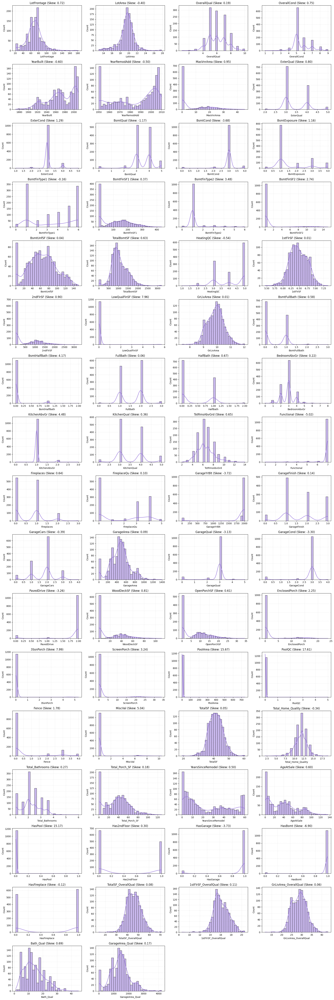

In [44]:
# 히스토그램


# 1. 수치형 컬럼만 자동 수집 (Id 제외, Target 포함 여부는 선택)
# 보통 타깃(SalePrice)의 분포도 같이 보는 게 좋아서 포함시키는 경우가 많음
numeric_cols = train.select_dtypes(include=['number']).columns
numeric_cols = [col for col in numeric_cols if col not in ['SalePrice_log', 'Id']]

# 2. 서브플롯 그리드 크기 계산
cols_per_row = 4
rows = (len(numeric_cols) - 1) // cols_per_row + 1

# 3. 전체 캔버스 크기 설정
plt.figure(figsize=(20, rows * 3.5))

# 4. 반복문으로 그리기
for i, feature in enumerate(numeric_cols):
    plt.subplot(rows, cols_per_row, i + 1)

    # histplot: 히스토그램 + 밀도 곡선(kde=True)
    sns.histplot(train[feature], kde=True, bins=30, color='mediumpurple', edgecolor='black')

    # 왜도(Skewness) 수치를 제목에 표시하면 더 유용함
    skewness = train[feature].skew()
    plt.title(f'{feature} (Skew: {skewness:.2f})')
    plt.grid(True, linestyle='--', alpha=0.3)

plt.tight_layout()
plt.show()


In [45]:
# 로버스트 스케일링ㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡㅡ

In [46]:
from sklearn.preprocessing import RobustScaler

# 1. 스케일링 대상 컬럼 선정
# (object 타입 제외, 그리고 타깃과 ID 제외)
scale_cols = train.select_dtypes(exclude=['object']).columns
scale_cols = scale_cols.drop(['Id', 'SalePrice', 'SalePrice_log'], errors='ignore')

print(f"스케일링 적용 컬럼 개수: {len(scale_cols)}")

# 2. 로버스트 스케일러 객체 생성
scaler = RobustScaler()

# 3. 학습(fit)은 오직 Train 데이터로만!
scaler.fit(train[scale_cols])

# 4. 변환(transform)은 Train과 Test 둘 다!
train[scale_cols] = scaler.transform(train[scale_cols])
test[scale_cols] = scaler.transform(test[scale_cols])

print("모든 수치형 변수에 Robust Scaling 완료!")

# 확인용 (스케일링이 잘 됐는지 중앙값 확인 -> 0 근처여야 함)
print(train[scale_cols].median().head())

스케일링 적용 컬럼 개수: 66
모든 수치형 변수에 Robust Scaling 완료!
LotFrontage    0.0
LotArea        0.0
OverallQual    0.0
OverallCond    0.0
YearBuilt      0.0
dtype: float64


In [47]:
train.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice_log,TotalSF,Total_Home_Quality,Total_Bathrooms,Total_Porch_SF,YearsSinceRemodel,AgeAtSale,HasPool,Has2ndFloor,HasGarage,HasBsmt,HasFireplace,TotalSF_OverallQual,1stFlrSF_OverallQual,GrLivArea_OverallQual,Bath_Qual,GarageArea_Qual
0,20,RL,0.25,-0.565208,Pave,None,IR1,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,-0.5,2.0,-0.382979,-1.033113,Hip,CompShg,Wd Sdng,Wd Sdng,BrkFace,0.957022,0.0,0.0,CBlock,-1.0,0.0,0.0,0.2,0.586678,0.0,0.0000,-0.589276,0.216323,GasA,-1.0,Y,SBrkr,0.044141,0.000000,0.0,-0.618988,1.0,0.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0,-1.0,-0.50,Attchd,-0.511628,-1.0,-1.0,-0.900000,0.0,0.0,0.0,0.000000,-0.586177,0.0,0.0,0.0,0.0,0.0,0.0,None,0.000000,7,2008,WD,Normal,11.813037,-0.282287,0.0,0.0,-1.065526,1.054054,0.382979,0.0,0.0,0.0,0.0,-1.0,-0.419714,-0.197154,-0.608214,-0.277778,-0.810606
1,90,RL,-0.50,0.331347,Pave,None,Reg,Lvl,AllPub,Inside,Gtl,Edwards,Norm,Norm,Duplex,1Story,-0.5,0.0,0.297872,-0.158940,Gable,CompShg,Plywood,Plywood,None,0.000000,0.0,0.0,CBlock,0.0,1.0,3.0,0.4,0.874828,0.0,0.0000,-1.392315,0.416912,GasA,-1.0,Y,SBrkr,0.237640,0.000000,0.0,-0.425681,3.0,0.0,1.0,0.0,0.0,0.0,0.0,-0.5,0.0,-1.0,-0.50,None,-45.976744,-2.0,-2.0,-1.983333,-3.0,-3.0,0.0,0.812283,-0.586177,0.0,0.0,0.0,0.0,0.0,0.0,None,0.000000,3,2009,WD,Alloca,12.095147,-0.066304,-1.0,8.0,-0.195045,0.189189,-0.276596,0.0,0.0,-1.0,0.0,-1.0,-0.293697,-0.057368,-0.498815,1.944444,-1.795455
2,20,RL,-0.80,0.940318,Pave,None,IR1,Lvl,AllPub,Inside,Gtl,Timber,Norm,Norm,1Fam,1Story,0.0,1.0,0.297872,-0.185430,Gable,CompShg,HdBoard,HdBoard,BrkFace,0.665689,0.0,0.0,CBlock,0.0,1.0,0.0,0.4,0.664113,1.0,5.2873,-0.888602,0.243854,GasA,-0.5,Y,SBrkr,0.120214,0.000000,0.0,-0.543203,1.0,0.0,0.0,0.0,-1.0,0.0,1.0,-0.5,0.0,0.0,0.25,Attchd,0.232558,-1.0,0.0,0.312500,0.0,0.0,0.0,0.834942,-0.586177,0.0,0.0,0.0,0.0,0.0,0.0,None,0.000000,7,2006,WD,Normal,12.078245,-0.224964,0.0,2.0,-0.171198,0.135135,-0.340426,0.0,0.0,0.0,0.0,0.0,-0.122541,0.147462,-0.336884,0.611111,0.291667
3,20,RL,1.15,0.595670,Pave,None,Reg,Lvl,AllPub,Inside,Gtl,NridgHt,Norm,Norm,1Fam,1Story,1.0,0.0,0.723404,0.344371,Hip,CompShg,VinylSd,VinylSd,BrkFace,1.224857,2.0,0.0,PConc,1.0,0.0,0.0,-0.6,-0.609362,0.0,0.0000,1.538575,1.388397,GasA,0.0,Y,SBrkr,0.985101,0.000000,0.0,0.338006,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.5,0.0,-1.0,-0.50,Attchd,0.697674,1.0,1.0,1.425000,0.0,0.0,0.0,1.018360,1.239072,0.0,0.0,0.0,0.0,0.0,0.0,None,0.000000,12,2007,New,Partial,12.669810,0.838854,0.5,0.0,0.837222,-0.378378,-0.744681,0.0,0.0,0.0,0.0,-1.0,1.014604,1.300535,0.610423,0.388889,1.303030
4,50,RL,-0.50,-0.363462,Pave,None,Reg,Lvl,AllPub,Corner,Gtl,NAmes,Artery,Norm,1Fam,1.5Fin,-0.5,2.0,-0.510638,0.317881,Gable,CompShg,MetalSd,MetalSd,None,0.000000,0.0,1.0,CBlock,-1.0,0.0,1.0,-0.6,-0.609362,0.0,0.0000,0.297517,-0.621436,GasA,0.0,Y,SBrkr,-1.032074,0.322761,0.0,-0.990451,0.0,0.0,-1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,-0.25,Detchd,0.604651,-1.0,0.0,0.416667,0.0,0.0,0.0,0.000000,-0.586177,0.0,0.0,0.0,0.0,0.0,3.0,Shed,8.085142,7,2007,WD,Normal,11.719134,-1.004888,0.0,-2.0,-1.065526,-0.351351,0.489362,0.0,1.0,0.0,0.0,0.0,-0.848320,-0.942147,-0.814710,-0.833333,0.386364


In [48]:
test.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,TotalSF,Total_Home_Quality,Total_Bathrooms,Total_Porch_SF,YearsSinceRemodel,AgeAtSale,HasPool,Has2ndFloor,HasGarage,HasBsmt,HasFireplace,TotalSF_OverallQual,1stFlrSF_OverallQual,GrLivArea_OverallQual,Bath_Qual,GarageArea_Qual
0,60,RL,2.55,1.325024,Pave,None,Reg,Lvl,AllPub,Corner,Gtl,NoRidge,Norm,Norm,1Fam,2Story,1.0,0.0,0.382979,-0.052980,Hip,CompShg,HdBoard,HdBoard,BrkFace,1.290573,1.0,0.0,CBlock,0.0,0.0,0.0,-0.6,-0.609362,0.0,0.000000,1.098426,0.589971,GasA,0.0,Y,SBrkr,0.413346,1.577060,0.0,1.148101,0.0,0.0,0.0,1.0,1.0,0.0,1.0,1.5,0.0,0.0,0.25,Attchd,0.325581,-1.0,0.0,-0.058333,0.0,0.0,0.0,0.843917,0.514262,0.000000,0.0,0.0,0.0,0.0,0.0,None,0.0,4,2006,WD,Normal,1.092151,0.5,1.0,0.188895,0.000000,-0.425532,0.0,1.0,0.0,0.0,0.0,1.176536,0.845256,1.159860,0.833333,-0.045455
1,60,RL,0.60,0.133299,Pave,None,IR1,Lvl,AllPub,Inside,Gtl,NoRidge,Norm,Norm,1Fam,2Story,0.5,0.0,0.468085,0.026490,Gable,CompShg,VinylSd,VinylSd,BrkFace,1.303233,1.0,0.0,PConc,0.0,0.0,0.0,0.4,0.229945,0.0,0.000000,0.245813,0.422812,GasA,0.0,Y,SBrkr,0.262879,1.864947,0.0,1.244761,0.0,0.0,0.0,1.0,1.0,0.0,1.0,1.5,0.0,0.0,0.25,Attchd,0.418605,0.0,1.0,1.020833,0.0,0.0,0.0,1.234190,0.712824,0.000000,0.0,0.0,0.0,0.0,0.0,None,0.0,6,2007,WD,Abnorml,1.106104,0.0,1.0,0.651168,-0.054054,-0.489362,0.0,1.0,0.0,0.0,0.0,0.944784,0.505706,1.013834,0.555556,0.935606
2,50,RL,0.45,0.020045,Pave,None,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Artery,Norm,1Fam,1.5Fin,0.0,2.0,-0.680851,-1.165563,Gable,CompShg,Wd Sdng,Wd Sdng,None,0.000000,0.0,0.0,CBlock,-1.0,0.0,0.0,0.0,0.040181,2.0,8.393654,-0.488415,-0.357915,GasA,-1.0,Y,FuseA,-0.253697,0.842636,0.0,0.179122,1.0,0.0,-1.0,0.0,0.0,0.0,-1.0,-0.5,0.0,1.0,0.25,Attchd,-0.837209,-1.0,-1.0,-0.983333,0.0,0.0,0.0,0.000000,-0.586177,6.947093,0.0,0.0,0.0,0.0,3.0,None,0.0,8,2006,WD,Normal,-0.082804,0.5,0.0,-0.709016,1.135135,0.638298,0.0,1.0,0.0,0.0,0.0,-0.035475,-0.125083,0.097747,-0.055556,-0.886364
3,70,RM,-1.00,0.216526,Pave,None,IR1,Bnk,AllPub,Inside,Gtl,OldTown,RRAn,Feedr,1Fam,2Story,0.5,1.0,-1.106383,-1.165563,Gable,CompShg,Stucco,Stucco,None,0.000000,0.0,0.0,BrkTil,-1.0,0.0,0.0,-0.6,-0.609362,0.0,0.000000,0.148499,-0.810226,GasA,-0.5,Y,SBrkr,-0.385502,1.117591,0.0,0.359131,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.5,0.0,-1.0,-0.50,Detchd,0.302326,-1.0,0.0,0.016667,0.0,0.0,0.0,0.161795,-0.222221,9.611165,0.0,0.0,0.0,0.0,4.0,None,0.0,4,2010,WD,Normal,-0.185463,0.5,0.0,-0.362635,1.243243,1.148936,0.0,1.0,0.0,0.0,-1.0,0.135969,0.023613,0.428393,0.166667,0.022727
4,50,RL,0.50,-0.245989,Pave,None,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1.5Fin,-0.5,0.0,-0.553191,-1.165563,Gable,CompShg,MetalSd,MetalSd,None,0.000000,0.0,0.0,CBlock,-1.0,0.0,0.0,-0.2,0.087358,0.0,0.000000,-0.173447,-0.306785,GasA,-1.0,Y,SBrkr,-0.562541,0.505630,0.0,-0.396738,0.0,0.0,-1.0,0.0,-1.0,0.0,0.0,0.0,0.0,-1.0,-0.50,Detchd,-0.697674,-1.0,-1.0,-0.583333,0.0,0.0,0.0,0.977326,-0.586177,11.823985,0.0,0.0,0.0,0.0,0.0,None,0.0,10,2008,COD,Abnorml,-0.447268,-1.0,-2.0,0.381418,1.189189,0.553191,0.0,1.0,0.0,0.0,-1.0,-0.516599,-0.623747,-0.482320,-0.833333,-0.522727


In [49]:
train.shape

(1162, 96)

In [50]:
test.shape

(292, 95)

In [51]:
# 피처 엔지니어링 저장

# train.to_csv('train_fe.csv', index=False)
# test.to_csv('test_fe.csv', index=False)

In [52]:
# 피처 엔지니어링 + 로버스트 스케일링 저장

train.to_csv('train_fe_rs.csv', index=False)
test.to_csv('test_fe_rs.csv', index=False)

In [53]:
print('저장 완료')

저장 완료


In [54]:
# SVR optuna

import numpy as np
import pandas as pd
import optuna
from sklearn.svm import SVR  # <--- 변경됨
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import RobustScaler
from sklearn.model_selection import cross_val_score, KFold, cross_val_predict
from sklearn.metrics import mean_squared_error

# =========================================================
# 0. 데이터 준비 (원핫 인코딩 필수)
# =========================================================
# (train, test 변수가 이미 메모리에 있다고 가정)
target_col = 'SalePrice_log' if 'SalePrice_log' in train.columns else 'SalePrice'
y_train = train[target_col]

X_train_raw = train.drop([target_col, 'Id'], axis=1, errors='ignore')
X_test_raw = test.drop([target_col, 'Id'], axis=1, errors='ignore')

all_data = pd.concat([X_train_raw, X_test_raw])
all_data_dummies = pd.get_dummies(all_data)

X_train = all_data_dummies[:len(train)]
X_test = all_data_dummies[len(train):]

print(f"원핫 인코딩 완료: 컬럼 수 {X_train.shape[1]}개")


# =========================================================
# 1. 목적 함수 정의 (Objective Function) - SVR용
# =========================================================
def objective(trial):
    # SVR 핵심 하이퍼파라미터 탐색 범위
    # C: 클수록 규제 감소 (데이터에 더 맞춤)
    # epsilon: 오차 허용 튜브의 너비 (작을수록 타이트하게 맞춤)
    # gamma: 데이터 포인트의 영향 범위 (클수록 복잡한 경계)

    C = trial.suggest_float('C', 1.0, 50.0)
    epsilon = trial.suggest_float('epsilon', 0.001, 0.1)
    gamma = trial.suggest_float('gamma', 0.0001, 0.01) # 'log' scale을 써도 좋음

    model = make_pipeline(
        RobustScaler(),
        SVR(kernel='rbf', C=C, epsilon=epsilon, gamma=gamma) # RBF 커널 사용
    )

    kf = KFold(n_splits=10, shuffle=True, random_state=42)

    # RMSE 계산 (음수로 반환되므로 - 붙임)
    scores = cross_val_score(model, X_train, y_train, scoring='neg_root_mean_squared_error', cv=kf, n_jobs=-1)
    rmse = -scores.mean()

    return rmse

# =========================================================
# 2. Optuna Study 생성 및 최적화
# =========================================================
sampler = optuna.samplers.TPESampler(seed=42)
study = optuna.create_study(direction='minimize', sampler=sampler)

# 3. [핵심] SVR 국룰 파라미터(Baseline) Enqueue
# House Prices 데이터셋에서 SVR은 보통 이 값 근처에서 최적입니다.
print("🚀 SVR 국룰 파라미터(Baseline)를 대기열에 추가합니다...")
study.enqueue_trial({'C': 20, 'epsilon': 0.008, 'gamma': 0.0003})

# 4. 최적화 실행
print("🔥 Optuna 최적화 시작 (SVR)...")
study.optimize(objective, n_trials=50) # SVR은 KRR보다 조금 느릴 수 있음 (적절히 조절)

# 5. 결과 확인
print("\n=============================================")
print(f"🏆 Best RMSE (Log Scale): {study.best_value:.5f}")
print(f"🔧 Best Params: {study.best_params}")
print("=============================================")


# =========================================================
# 6. 최적 모델로 재학습 및 Test 예측 (Submission)
# =========================================================
best_params = study.best_params
best_svr = make_pipeline(
    RobustScaler(),
    SVR(kernel='rbf',
        C=best_params['C'],
        epsilon=best_params['epsilon'],
        gamma=best_params['gamma'])
)

# 전체 데이터 학습
print("전체 데이터 학습 중...")
best_svr.fit(X_train, y_train)

# Test 예측 및 역변환
pred_log_opt = best_svr.predict(X_test)
pred_final_opt = np.expm1(pred_log_opt)

# 제출 파일 저장
if 'submission' not in locals():
    submission = pd.read_csv('sample_submission.csv')
else:
    submission['SalePrice'] = pred_final_opt

submission.to_csv('submission_svr_optuna.csv', index=False)
print("✅ 최적화된 SVR 제출 파일(submission_svr_optuna.csv) 저장 완료!")


# =========================================================
# 7. 스태킹용 OOF(Out-of-Fold) 추출 및 저장
# =========================================================
print("\n🚀 스태킹을 위한 SVR OOF 데이터 생성 중...")

# 동일한 CV 전략 사용
kf = KFold(n_splits=10, shuffle=True, random_state=42)

# cross_val_predict (OOF 생성)
oof_preds_log = cross_val_predict(best_svr, X_train, y_train, cv=kf, n_jobs=-1)

# [점수 확인] ---------------------------------------------------------
# 1. 로그 스케일 RMSE
oof_rmse_log = np.sqrt(mean_squared_error(y_train, oof_preds_log))

# 2. 원래 가격 단위로 역변환하여 RMSE 계산
y_train_original = np.expm1(y_train)
oof_preds_original = np.expm1(oof_preds_log)
oof_rmse_original = np.sqrt(mean_squared_error(y_train_original, oof_preds_original))

print(f"✅ SVR OOF RMSE (Log Scale): {oof_rmse_log:.5f}")
print(f"💰 SVR OOF RMSE (Original Scale): ${oof_rmse_original:,.2f}")
# ---------------------------------------------------------------------

# ★★★ train 데이터프레임에 바로 'oof_svr' 컬럼으로 추가 ★★★
train['oof_svr'] = oof_preds_log

# train 데이터프레임을 통째로 저장 (인덱스 유지)
train.to_csv('train_with_svr_oof.csv', index=True)
print("✅ train 데이터프레임에 SVR OOF를 추가하여 저장(train_with_svr_oof.csv) 완료!")

# 메모리/혼동 방지를 위해 컬럼 삭제 (선택 사항)
train = train.drop(columns=['oof_svr'], errors='ignore')
print('추가했던 oof_svr 컬럼 삭제 완료 (파일에는 저장됨)')

[I 2026-01-01 23:29:18,731] A new study created in memory with name: no-name-c3a4abe8-b441-4da6-bfd0-0aec24364a7a


원핫 인코딩 완료: 컬럼 수 275개
🚀 SVR 국룰 파라미터(Baseline)를 대기열에 추가합니다...
🔥 Optuna 최적화 시작 (SVR)...


[I 2026-01-01 23:29:23,722] Trial 0 finished with value: 0.1188897727670872 and parameters: {'C': 20, 'epsilon': 0.008, 'gamma': 0.0003}. Best is trial 0 with value: 0.1188897727670872.
[I 2026-01-01 23:29:25,018] Trial 1 finished with value: 0.14972079946546377 and parameters: {'C': 19.352465823520763, 'epsilon': 0.0951207163345817, 'gamma': 0.007346740023932911}. Best is trial 0 with value: 0.1188897727670872.
[I 2026-01-01 23:29:30,447] Trial 2 finished with value: 0.12907696829501947 and parameters: {'C': 30.334265725654795, 'epsilon': 0.016445845403801215, 'gamma': 0.0016443457513284064}. Best is trial 0 with value: 0.1188897727670872.
[I 2026-01-01 23:29:33,397] Trial 3 finished with value: 0.14200818895234676 and parameters: {'C': 3.8460969962417737, 'epsilon': 0.08675143843171859, 'gamma': 0.006051038616257768}. Best is trial 0 with value: 0.1188897727670872.
[I 2026-01-01 23:29:38,855] Trial 4 finished with value: 0.14881240650005761 and parameters: {'C': 35.69555631200623, 'e


🏆 Best RMSE (Log Scale): 0.11773
🔧 Best Params: {'C': 9.113328058424976, 'epsilon': 0.015216226695427295, 'gamma': 0.0005711910316468292}
전체 데이터 학습 중...
✅ 최적화된 SVR 제출 파일(submission_svr_optuna.csv) 저장 완료!

🚀 스태킹을 위한 SVR OOF 데이터 생성 중...
✅ SVR OOF RMSE (Log Scale): 0.11847
💰 SVR OOF RMSE (Original Scale): $25,151.02
✅ train 데이터프레임에 SVR OOF를 추가하여 저장(train_with_svr_oof.csv) 완료!
추가했던 oof_svr 컬럼 삭제 완료 (파일에는 저장됨)


In [55]:
import pandas as pd
import numpy as np
from sklearn.inspection import permutation_importance
from scipy.stats import ttest_1samp

# 1. 출력 옵션 설정
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', 1000)
pd.set_option('display.float_format', '{:.6f}'.format) # 소수점 포맷 지정

print("⏳ SVR 순열 중요도 계산 중... (n_repeats=10)")
print("   (SVR은 계산 비용이 높아 시간이 조금 더 걸릴 수 있습니다.)")

# 2. 순열 중요도 계산
# best_svr: 학습된 SVR 모델 객체
results = permutation_importance(
    best_svr,
    X_train,
    y_train,
    n_repeats=10,
    random_state=42,
    n_jobs=-1,
    scoring='neg_root_mean_squared_error'
)

# 3. p-value 직접 계산
# 귀무가설: "해당 피처를 섞어도 성능 저하가 없다 (중요도=0)"
importances = results.importances
p_values = [ttest_1samp(importances[i, :], 0).pvalue for i in range(importances.shape[0])]

# 4. 데이터프레임 변환 및 통계 지표 추가
importance_df = pd.DataFrame({
    'Feature': X_train.columns,
    'Importance': results.importances_mean,
    'Std': results.importances_std,
    'p_value': p_values,
    'n': [importances.shape[1]] * importances.shape[0]
})

# 99% 신뢰구간 계산 (Z-score 2.58 적용)
# Importance ± 2.58 * Std 구간이 0을 포함하지 않아야 통계적으로 유의미하게 중요함
importance_df['p99_high'] = importance_df['Importance'] + (2.58 * importance_df['Std'])
importance_df['p99_low'] = importance_df['Importance'] - (2.58 * importance_df['Std'])

# 중요도 순으로 내림차순 정렬
importance_df = importance_df.sort_values(by='Importance', ascending=False).reset_index(drop=True)

# 5. 결과 출력
print("\n=== SVR Feature Permutation Importance ===")
display_cols = ['Feature', 'Importance', 'Std', 'p_value', 'p99_low', 'p99_high']
print(importance_df[display_cols])

# 6. CSV 저장
importance_df.to_csv('svr_feature_importance.csv', index=False)
print("\n✅ svr_feature_importance.csv 파일로 저장되었습니다.")

⏳ SVR 순열 중요도 계산 중... (n_repeats=10)
   (SVR은 계산 비용이 높아 시간이 조금 더 걸릴 수 있습니다.)

=== SVR Feature Permutation Importance ===
                   Feature  Importance      Std  p_value   p99_low  p99_high
0                GrLivArea    0.018542 0.001015 0.000000  0.015923  0.021161
1                  TotalSF    0.017850 0.000926 0.000000  0.015460  0.020240
2              GarageYrBlt    0.017023 0.002033 0.000000  0.011777  0.022268
3                  LotArea    0.016226 0.000657 0.000000  0.014532  0.017920
4                 PoolArea    0.013762 0.003900 0.000002  0.003700  0.023825
5                 2ndFlrSF    0.013190 0.000741 0.000000  0.011278  0.015102
6              OverallCond    0.011515 0.001104 0.000000  0.008667  0.014363
7                AgeAtSale    0.009587 0.000950 0.000000  0.007137  0.012038
8                YearBuilt    0.009524 0.000940 0.000000  0.007100  0.011948
9      TotalSF_OverallQual    0.009324 0.000782 0.000000  0.007308  0.011341
10              GarageCars    0.0

In [56]:
# SVR 피처 삭제 OOF 추출

import numpy as np
import pandas as pd
import optuna
from sklearn.svm import SVR
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import RobustScaler
from sklearn.model_selection import cross_val_score, KFold, cross_val_predict
from sklearn.metrics import mean_squared_error

# ====================================================================
# 0. SVR 피처 중요도(permutation_importance) 결과 불러오기
# ====================================================================
# (앞서 실행한 코드에서 생성된 importance_df가 메모리에 있다고 가정)
# 만약 없다면 csv에서 불러오기: importance_df = pd.read_csv('svr_feature_importance.csv')

# ---------------------------------------------------------
# 1. 타겟 설정 및 원본 데이터 준비 (원핫 인코딩 전)
# ---------------------------------------------------------
target_col = 'SalePrice_log' if 'SalePrice_log' in train.columns else 'SalePrice'
y_train = train[target_col]

X_train_raw = train.drop([target_col, 'Id'], axis=1, errors='ignore')
X_test_raw = test.drop([target_col, 'Id'], axis=1, errors='ignore')

# 2. 전체 데이터 합쳐서 원핫 인코딩 (Train/Test 컬럼 일치화)
all_data = pd.concat([X_train_raw, X_test_raw])
all_data_dummies = pd.get_dummies(all_data)

print(f"원핫 인코딩 후 전체 컬럼 수: {all_data_dummies.shape[1]}개")

# ---------------------------------------------------------
# 3. 중요도 기반 삭제 리스트 생성 (SVR 기준)
# ---------------------------------------------------------
# 기준 1: 중요도가 0 이하 (모델 성능에 전혀 기여하지 못하거나 방해되는 피처)
drop_1 = importance_df[importance_df['Importance'] <= 0]['Feature'].tolist()

# 기준 2: 통계적 유의성이 떨어지는 피처 (p_value > 0.05 AND 신뢰구간 하한 < 0)
# (선택 사항: 너무 많이 지우면 위험하므로 기준 1만 적용해도 충분함)
# drop_2 = importance_df[(importance_df['p_value'] > 0.05) & (importance_df['p99_low'] < 0)]['Feature'].tolist()
drop_2 = []

# 전체 삭제 대상 합치기 (중복 제거)
total_drop = list(set(drop_1 + drop_2))

print(f"🗑️ [SVR 기준] 삭제할 노이즈 피처 수: {len(total_drop)}개")

# 4. 데이터프레임에서 노이즈 피처 일괄 삭제
all_data_cleaned = all_data_dummies.drop(columns=total_drop, errors='ignore')

# 5. 데이터 다시 분리
X_train = all_data_cleaned[:len(train)]
X_test = all_data_cleaned[len(train):]

print(f"✅ 최종 피처 선택 완료: {X_train.shape[1]}개 컬럼 남음 (SVR 학습용)")


# ====================================================================
# 2. SVR 하이퍼파라미터 최적화 (Optuna)
# ====================================================================

# 목적 함수 정의
def objective(trial):
    # SVR 핵심 파라미터 탐색
    C = trial.suggest_float('C', 1.0, 50.0)
    epsilon = trial.suggest_float('epsilon', 0.001, 0.1)
    gamma = trial.suggest_float('gamma', 0.0001, 0.01) # log=True를 써도 좋음

    model = make_pipeline(
        RobustScaler(),
        SVR(kernel='rbf', C=C, epsilon=epsilon, gamma=gamma)
    )

    kf = KFold(n_splits=10, shuffle=True, random_state=42)

    # RMSE 계산
    scores = cross_val_score(model, X_train, y_train, scoring='neg_root_mean_squared_error', cv=kf, n_jobs=-1)
    rmse = -scores.mean()

    return rmse

# Optuna Study 생성
sampler = optuna.samplers.TPESampler(seed=42)
study = optuna.create_study(direction='minimize', sampler=sampler)

# [핵심] SVR 국룰 파라미터 Enqueue (피처가 줄었으니 최적값은 조금 달라질 수 있음)
print("🚀 SVR 국룰 파라미터(Baseline)를 대기열에 추가합니다...")
study.enqueue_trial({'C': 20, 'epsilon': 0.008, 'gamma': 0.0003})

# 최적화 실행
print("🔥 Optuna 최적화 시작 (SVR)...")
study.optimize(objective, n_trials=50) # SVR은 속도가 느릴 수 있으니 횟수 조절

# 결과 확인
print("\n=============================================")
print(f"🏆 Best RMSE (Log Scale): {study.best_value:.5f}")
print(f"🔧 Best Params: {study.best_params}")
print("=============================================")


# ====================================================================
# 3. 최적 모델로 재학습 및 결과 저장
# ====================================================================
best_params = study.best_params
best_svr = make_pipeline(
    RobustScaler(),
    SVR(kernel='rbf',
        C=best_params['C'],
        epsilon=best_params['epsilon'],
        gamma=best_params['gamma'])
)

# 전체 데이터 학습
print("전체 데이터로 최종 학습 중...")
best_svr.fit(X_train, y_train)

# Test 예측 및 역변환
pred_log_opt = best_svr.predict(X_test)
pred_final_opt = np.expm1(pred_log_opt)

# 제출 파일 저장
if 'submission' not in locals():
    test_ids = test['Id'] if 'Id' in test.columns else range(1461, 1461+len(pred_final_opt))
    submission = pd.DataFrame({'Id': test_ids, 'SalePrice': pred_final_opt})
else:
    submission['SalePrice'] = pred_final_opt

submission.to_csv('submission_svr_optuna.csv', index=False)
print("✅ 최적화된 SVR 제출 파일(submission_svr_optuna.csv) 저장 완료!")


# ==========================================================
# 4. 스태킹용 OOF(Out-of-Fold) 추출 및 저장 (Id 없이)
# ==========================================================
print("\n🚀 스태킹을 위한 SVR OOF 데이터 생성 중...")

kf = KFold(n_splits=10, shuffle=True, random_state=42)

# cross_val_predict
oof_preds_log = cross_val_predict(best_svr, X_train, y_train, cv=kf, n_jobs=-1)

# [점수 확인]
oof_rmse_log = np.sqrt(mean_squared_error(y_train, oof_preds_log))
oof_rmse_original = np.sqrt(mean_squared_error(np.expm1(y_train), np.expm1(oof_preds_log)))

print(f"✅ SVR OOF RMSE (Log Scale): {oof_rmse_log:.5f}")
print(f"💰 SVR OOF RMSE (Original Scale): ${oof_rmse_original:,.2f}")

# ★★★ train 데이터프레임에 바로 'oof_svr' 컬럼으로 추가 ★★★
train['oof_svr'] = oof_preds_log

# train 데이터프레임을 통째로 저장
train.to_csv('train_with_svr_oof.csv', index=True)
print("✅ train 데이터프레임에 SVR OOF를 추가하여 저장(train_with_svr_oof.csv) 완료!")

# 메모리/혼동 방지를 위해 컬럼 삭제
train = train.drop(columns=['oof_svr'], errors='ignore')
print('추가했던 oof_svr 컬럼 삭제 완료 (파일에는 저장됨)')

[I 2026-01-01 23:46:12,412] A new study created in memory with name: no-name-87ce4e15-f6ef-4041-b79c-adce3bd49014


원핫 인코딩 후 전체 컬럼 수: 275개
🗑️ [SVR 기준] 삭제할 노이즈 피처 수: 18개
✅ 최종 피처 선택 완료: 257개 컬럼 남음 (SVR 학습용)
🚀 SVR 국룰 파라미터(Baseline)를 대기열에 추가합니다...
🔥 Optuna 최적화 시작 (SVR)...


[I 2026-01-01 23:46:16,048] Trial 0 finished with value: 0.11831957513342536 and parameters: {'C': 20, 'epsilon': 0.008, 'gamma': 0.0003}. Best is trial 0 with value: 0.11831957513342536.
[I 2026-01-01 23:46:17,376] Trial 1 finished with value: 0.14938992863496903 and parameters: {'C': 19.352465823520763, 'epsilon': 0.0951207163345817, 'gamma': 0.007346740023932911}. Best is trial 0 with value: 0.11831957513342536.
[I 2026-01-01 23:46:21,590] Trial 2 finished with value: 0.1285874517007334 and parameters: {'C': 30.334265725654795, 'epsilon': 0.016445845403801215, 'gamma': 0.0016443457513284064}. Best is trial 0 with value: 0.11831957513342536.
[I 2026-01-01 23:46:22,837] Trial 3 finished with value: 0.14169153623599182 and parameters: {'C': 3.8460969962417737, 'epsilon': 0.08675143843171859, 'gamma': 0.006051038616257768}. Best is trial 0 with value: 0.11831957513342536.
[I 2026-01-01 23:46:25,997] Trial 4 finished with value: 0.14885369661594433 and parameters: {'C': 35.69555631200623


🏆 Best RMSE (Log Scale): 0.11745
🔧 Best Params: {'C': 5.124886422310832, 'epsilon': 0.01699261466839093, 'gamma': 0.0005589614941997789}
전체 데이터로 최종 학습 중...
✅ 최적화된 SVR 제출 파일(submission_svr_optuna.csv) 저장 완료!

🚀 스태킹을 위한 SVR OOF 데이터 생성 중...
✅ SVR OOF RMSE (Log Scale): 0.11820
💰 SVR OOF RMSE (Original Scale): $25,281.92
✅ train 데이터프레임에 SVR OOF를 추가하여 저장(train_with_svr_oof.csv) 완료!
추가했던 oof_svr 컬럼 삭제 완료 (파일에는 저장됨)


In [57]:
# XGB

import numpy as np
import pandas as pd
import optuna
import xgboost as xgb  # <--- 변경됨
from sklearn.model_selection import cross_val_score, KFold, cross_val_predict
from sklearn.metrics import mean_squared_error

# =========================================================
# 0. 데이터 준비 (원핫 인코딩 필수)
# =========================================================
# (train, test 변수가 이미 메모리에 있다고 가정)
target_col = 'SalePrice_log' if 'SalePrice_log' in train.columns else 'SalePrice'
y_train = train[target_col]

X_train_raw = train.drop([target_col, 'Id'], axis=1, errors='ignore')
X_test_raw = test.drop([target_col, 'Id'], axis=1, errors='ignore')

all_data = pd.concat([X_train_raw, X_test_raw])
all_data_dummies = pd.get_dummies(all_data)

X_train = all_data_dummies[:len(train)]
X_test = all_data_dummies[len(train):]

print(f"원핫 인코딩 완료: 컬럼 수 {X_train.shape[1]}개")


# =========================================================
# 1. 목적 함수 정의 (Objective Function) - XGBoost용
# =========================================================
def objective(trial):
    # XGBoost 핵심 하이퍼파라미터 탐색 범위
    params = {
        'n_estimators': trial.suggest_int('n_estimators', 500, 3000),
        'max_depth': trial.suggest_int('max_depth', 3, 10),
        'learning_rate': trial.suggest_float('learning_rate', 0.005, 0.1, log=True),
        'subsample': trial.suggest_float('subsample', 0.5, 1.0),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.5, 1.0),
        'min_child_weight': trial.suggest_int('min_child_weight', 1, 10),
        'gamma': trial.suggest_float('gamma', 0.0, 5.0),
        'reg_alpha': trial.suggest_float('reg_alpha', 1e-5, 10.0, log=True),
        'reg_lambda': trial.suggest_float('reg_lambda', 1e-5, 10.0, log=True),
        'n_jobs': -1,
        'random_state': 42
    }

    # XGBoost는 스케일링(RobustScaler)이 필요 없습니다.
    model = xgb.XGBRegressor(**params)

    kf = KFold(n_splits=10, shuffle=True, random_state=42)

    # RMSE 계산 (음수로 반환되므로 - 붙임)
    scores = cross_val_score(model, X_train, y_train, scoring='neg_root_mean_squared_error', cv=kf, n_jobs=-1)
    rmse = -scores.mean()

    return rmse

# =========================================================
# 2. Optuna Study 생성 및 최적화
# =========================================================
sampler = optuna.samplers.TPESampler(seed=42)
study = optuna.create_study(direction='minimize', sampler=sampler)

# 3. [핵심] XGBoost 국룰 파라미터(Baseline) Enqueue
# House Prices 데이터셋에서 자주 쓰이는 안정적인 값들을 시작점으로 줍니다.
print("🚀 XGBoost 국룰 파라미터(Baseline)를 대기열에 추가합니다...")
study.enqueue_trial({
    'n_estimators': 2000,
    'max_depth': 4,
    'learning_rate': 0.01,
    'subsample': 0.7,
    'colsample_bytree': 0.5,
    'min_child_weight': 3,
    'gamma': 0,
    'reg_alpha': 0.001,
    'reg_lambda': 0.001
})

# 4. 최적화 실행
print("🔥 Optuna 최적화 시작 (XGBoost)...")
study.optimize(objective, n_trials=50)

# 5. 결과 확인
print("\n=============================================")
print(f"🏆 Best RMSE (Log Scale): {study.best_value:.5f}")
print(f"🔧 Best Params: {study.best_params}")
print("=============================================")


# =========================================================
# 6. 최적 모델로 재학습 및 Test 예측 (Submission)
# =========================================================
best_params = study.best_params
# best_params에는 n_jobs나 random_state가 없으므로 다시 추가
best_xgb = xgb.XGBRegressor(**best_params, n_jobs=-1, random_state=42)

# 전체 데이터 학습
print("전체 데이터 학습 중...")
best_xgb.fit(X_train, y_train)

# Test 예측 및 역변환
pred_log_opt = best_xgb.predict(X_test)
pred_final_opt = np.expm1(pred_log_opt)

# 제출 파일 저장
if 'submission' not in locals():
    submission = pd.read_csv('sample_submission.csv')
else:
    submission['SalePrice'] = pred_final_opt

submission.to_csv('submission_xgb_optuna.csv', index=False)
print("✅ 최적화된 XGBoost 제출 파일(submission_xgb_optuna.csv) 저장 완료!")


# =========================================================
# 7. 스태킹용 OOF(Out-of-Fold) 추출 및 저장
# =========================================================
print("\n🚀 스태킹을 위한 XGBoost OOF 데이터 생성 중...")

# 동일한 CV 전략 사용
kf = KFold(n_splits=10, shuffle=True, random_state=42)

# cross_val_predict (OOF 생성)
oof_preds_log = cross_val_predict(best_xgb, X_train, y_train, cv=kf, n_jobs=-1)

# [점수 확인] ---------------------------------------------------------
# 1. 로그 스케일 RMSE
oof_rmse_log = np.sqrt(mean_squared_error(y_train, oof_preds_log))

# 2. 원래 가격 단위로 역변환하여 RMSE 계산
y_train_original = np.expm1(y_train)
oof_preds_original = np.expm1(oof_preds_log)
oof_rmse_original = np.sqrt(mean_squared_error(y_train_original, oof_preds_original))

print(f"✅ XGB OOF RMSE (Log Scale): {oof_rmse_log:.5f}")
print(f"💰 XGB OOF RMSE (Original Scale): ${oof_rmse_original:,.2f}")
# ---------------------------------------------------------------------

# ★★★ train 데이터프레임에 바로 'oof_xgb' 컬럼으로 추가 ★★★
train['oof_xgb'] = oof_preds_log

# train 데이터프레임을 통째로 저장 (인덱스 유지)
train.to_csv('train_with_xgb_oof.csv', index=True)
print("✅ train 데이터프레임에 XGB OOF를 추가하여 저장(train_with_xgb_oof.csv) 완료!")

# 메모리/혼동 방지를 위해 컬럼 삭제 (선택 사항)
train = train.drop(columns=['oof_xgb'], errors='ignore')
print('추가했던 oof_xgb 컬럼 삭제 완료 (파일에는 저장됨)')

[I 2026-01-01 23:48:31,123] A new study created in memory with name: no-name-86fa2c66-e0be-49e7-b261-5a064d8db80c


원핫 인코딩 완료: 컬럼 수 275개
🚀 XGBoost 국룰 파라미터(Baseline)를 대기열에 추가합니다...
🔥 Optuna 최적화 시작 (XGBoost)...


[I 2026-01-01 23:49:05,112] Trial 0 finished with value: 0.11705921746636212 and parameters: {'n_estimators': 2000, 'max_depth': 4, 'learning_rate': 0.01, 'subsample': 0.7, 'colsample_bytree': 0.5, 'min_child_weight': 3, 'gamma': 0, 'reg_alpha': 0.001, 'reg_lambda': 0.001}. Best is trial 0 with value: 0.11705921746636212.
[I 2026-01-01 23:49:19,266] Trial 1 finished with value: 0.14085574511052412 and parameters: {'n_estimators': 1436, 'max_depth': 10, 'learning_rate': 0.044803926826840625, 'subsample': 0.7993292420985183, 'colsample_bytree': 0.5780093202212182, 'min_child_weight': 2, 'gamma': 0.2904180608409973, 'reg_alpha': 1.574189004745663, 'reg_lambda': 0.040428727350273294}. Best is trial 0 with value: 0.11705921746636212.
[I 2026-01-01 23:49:40,820] Trial 2 finished with value: 0.1467001974323267 and parameters: {'n_estimators': 2270, 'max_depth': 3, 'learning_rate': 0.09138013915892866, 'subsample': 0.9162213204002109, 'colsample_bytree': 0.6061695553391381, 'min_child_weight':


🏆 Best RMSE (Log Scale): 0.11706
🔧 Best Params: {'n_estimators': 2000, 'max_depth': 4, 'learning_rate': 0.01, 'subsample': 0.7, 'colsample_bytree': 0.5, 'min_child_weight': 3, 'gamma': 0.0, 'reg_alpha': 0.001, 'reg_lambda': 0.001}
전체 데이터 학습 중...
✅ 최적화된 XGBoost 제출 파일(submission_xgb_optuna.csv) 저장 완료!

🚀 스태킹을 위한 XGBoost OOF 데이터 생성 중...
✅ XGB OOF RMSE (Log Scale): 0.11805
💰 XGB OOF RMSE (Original Scale): $22,390.96
✅ train 데이터프레임에 XGB OOF를 추가하여 저장(train_with_xgb_oof.csv) 완료!
추가했던 oof_xgb 컬럼 삭제 완료 (파일에는 저장됨)


In [58]:
import pandas as pd
import numpy as np
from sklearn.inspection import permutation_importance
from scipy.stats import ttest_1samp

# 1. 출력 옵션 설정
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', 1000)
pd.set_option('display.float_format', '{:.6f}'.format)

print("⏳ XGBoost 순열 중요도 계산 중... (n_repeats=10)")
# XGBoost는 SVR보다 예측 속도가 빨라 계산이 비교적 빨리 끝납니다.

# 2. 순열 중요도 계산
# best_xgb: 학습된 XGBoost 모델 객체
results = permutation_importance(
    best_xgb,
    X_train,
    y_train,
    n_repeats=10,
    random_state=42,
    n_jobs=-1,
    scoring='neg_root_mean_squared_error'
)

# 3. p-value 직접 계산
# 귀무가설: "이 피처는 모델 성능에 아무런 영향이 없다 (중요도=0)"
importances = results.importances
p_values = [ttest_1samp(importances[i, :], 0).pvalue for i in range(importances.shape[0])]

# 4. 데이터프레임 변환 및 통계 지표 추가
importance_df = pd.DataFrame({
    'Feature': X_train.columns,
    'Importance': results.importances_mean,
    'Std': results.importances_std,
    'p_value': p_values,
    'n': [importances.shape[1]] * importances.shape[0]
})

# 99% 신뢰구간 계산
importance_df['p99_high'] = importance_df['Importance'] + (2.58 * importance_df['Std'])
importance_df['p99_low'] = importance_df['Importance'] - (2.58 * importance_df['Std'])

# 중요도 순으로 내림차순 정렬
importance_df = importance_df.sort_values(by='Importance', ascending=False).reset_index(drop=True)

# 5. 결과 출력
print("\n=== XGBoost Feature Permutation Importance ===")
display_cols = ['Feature', 'Importance', 'Std', 'p_value', 'p99_low', 'p99_high']
print(importance_df[display_cols])

# 6. CSV 저장
importance_df.to_csv('xgb_feature_importance.csv', index=False)
print("\n✅ xgb_feature_importance.csv 파일로 저장되었습니다.")

⏳ XGBoost 순열 중요도 계산 중... (n_repeats=10)

=== XGBoost Feature Permutation Importance ===
                   Feature  Importance      Std  p_value   p99_low  p99_high
0      TotalSF_OverallQual    0.123070 0.002500 0.000000  0.116619  0.129520
1    GrLivArea_OverallQual    0.036842 0.001346 0.000000  0.033370  0.040314
2                  TotalSF    0.033451 0.000871 0.000000  0.031204  0.035698
3                Bath_Qual    0.025197 0.000931 0.000000  0.022795  0.027598
4                  LotArea    0.016036 0.000520 0.000000  0.014694  0.017378
5              OverallCond    0.011431 0.000796 0.000000  0.009376  0.013486
6           Total_Porch_SF    0.009338 0.000471 0.000000  0.008122  0.010554
7         MSZoning_C (all)    0.008938 0.000738 0.000000  0.007036  0.010841
8        YearsSinceRemodel    0.008035 0.000427 0.000000  0.006934  0.009136
9              KitchenQual    0.007715 0.000569 0.000000  0.006246  0.009183
10    1stFlrSF_OverallQual    0.007395 0.000276 0.000000  0.00668

In [59]:
import numpy as np
import pandas as pd
import optuna
import xgboost as xgb
from sklearn.model_selection import cross_val_score, KFold, cross_val_predict
from sklearn.metrics import mean_squared_error

# ====================================================================
# 0. XGBoost 피처 중요도(permutation_importance) 결과 사용
# ====================================================================
# (앞서 실행한 XGBoost 순열 중요도 코드에서 생성된 importance_df가 메모리에 있다고 가정)
# 만약 없다면 csv에서 불러오기:
# importance_df = pd.read_csv('xgb_feature_importance.csv')

# ---------------------------------------------------------
# 1. 타겟 설정 및 원본 데이터 준비 (원핫 인코딩 전)
# ---------------------------------------------------------
target_col = 'SalePrice_log' if 'SalePrice_log' in train.columns else 'SalePrice'
y_train = train[target_col]

X_train_raw = train.drop([target_col, 'Id'], axis=1, errors='ignore')
X_test_raw = test.drop([target_col, 'Id'], axis=1, errors='ignore')

# 2. 전체 데이터 합쳐서 원핫 인코딩
all_data = pd.concat([X_train_raw, X_test_raw])
all_data_dummies = pd.get_dummies(all_data)

print(f"원핫 인코딩 후 전체 컬럼 수: {all_data_dummies.shape[1]}개")

# ---------------------------------------------------------
# 3. 중요도 기반 삭제 리스트 생성 (XGBoost 기준)
# ---------------------------------------------------------
# 기준 1: 중요도가 0 이하 (모델 성능에 기여 X or 방해)
drop_1 = importance_df[importance_df['Importance'] <= 0]['Feature'].tolist()

# 기준 2: (선택 사항 - 여기서는 비워둠)
drop_2 = []

# 전체 삭제 대상 합치기
total_drop = list(set(drop_1 + drop_2))

print(f"🗑️ [XGB 기준] 삭제할 노이즈 피처 수: {len(total_drop)}개")

# 4. 데이터프레임에서 노이즈 피처 일괄 삭제
all_data_cleaned = all_data_dummies.drop(columns=total_drop, errors='ignore')

# 5. 데이터 다시 분리
X_train = all_data_cleaned[:len(train)]
X_test = all_data_cleaned[len(train):]

print(f"✅ 최종 피처 선택 완료: {X_train.shape[1]}개 컬럼 남음 (XGB 학습용)")


# ====================================================================
# 2. XGBoost 하이퍼파라미터 최적화 (Optuna)
# ====================================================================

# 목적 함수 정의
def objective(trial):
    # XGBoost 핵심 파라미터 탐색
    params = {
        'n_estimators': trial.suggest_int('n_estimators', 500, 3000),
        'max_depth': trial.suggest_int('max_depth', 3, 10),
        'learning_rate': trial.suggest_float('learning_rate', 0.005, 0.1, log=True),
        'subsample': trial.suggest_float('subsample', 0.5, 1.0),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.5, 1.0),
        'min_child_weight': trial.suggest_int('min_child_weight', 1, 10),
        'gamma': trial.suggest_float('gamma', 0.0, 5.0),
        'reg_alpha': trial.suggest_float('reg_alpha', 1e-5, 10.0, log=True),
        'reg_lambda': trial.suggest_float('reg_lambda', 1e-5, 10.0, log=True),
        'n_jobs': -1,
        'random_state': 42,
        'verbosity': 0
    }

    # XGBoost는 스케일링(RobustScaler) 불필요 -> 바로 모델 사용
    model = xgb.XGBRegressor(**params)

    kf = KFold(n_splits=10, shuffle=True, random_state=42)

    # RMSE 계산
    scores = cross_val_score(model, X_train, y_train, scoring='neg_root_mean_squared_error', cv=kf, n_jobs=-1)
    rmse = -scores.mean()

    return rmse

# Optuna Study 생성
sampler = optuna.samplers.TPESampler(seed=42)
study = optuna.create_study(direction='minimize', sampler=sampler)

# [핵심] XGBoost 국룰 파라미터 Enqueue
print("🚀 XGBoost 국룰 파라미터(Baseline)를 대기열에 추가합니다...")
study.enqueue_trial({
    'n_estimators': 2000,
    'max_depth': 4,
    'learning_rate': 0.01,
    'subsample': 0.7,
    'colsample_bytree': 0.5,
    'min_child_weight': 3,
    'gamma': 0,
    'reg_alpha': 0.001,
    'reg_lambda': 0.001
})

# 최적화 실행
print("🔥 Optuna 최적화 시작 (XGBoost)...")
study.optimize(objective, n_trials=50)

# 결과 확인
print("\n=============================================")
print(f"🏆 Best RMSE (Log Scale): {study.best_value:.5f}")
print(f"🔧 Best Params: {study.best_params}")
print("=============================================")


# ====================================================================
# 3. 최적 모델로 재학습 및 결과 저장
# ====================================================================
best_params = study.best_params
# n_jobs, random_state 등 고정 파라미터 추가
best_xgb = xgb.XGBRegressor(**best_params, n_jobs=-1, random_state=42, verbosity=0)

# 전체 데이터 학습
print("전체 데이터로 최종 학습 중...")
best_xgb.fit(X_train, y_train)

# Test 예측 및 역변환
pred_log_opt = best_xgb.predict(X_test)
pred_final_opt = np.expm1(pred_log_opt)

# 제출 파일 저장
if 'submission' not in locals():
    # submission 변수 생성 (예시)
    ids = test['Id'] if 'Id' in test.columns else range(1461, 1461+len(pred_final_opt))
    submission = pd.DataFrame({'Id': ids, 'SalePrice': pred_final_opt})
else:
    submission['SalePrice'] = pred_final_opt

submission.to_csv('submission_xgb_optuna.csv', index=False)
print("✅ 최적화된 XGBoost 제출 파일(submission_xgb_optuna.csv) 저장 완료!")


# ==========================================================
# 4. 스태킹용 OOF(Out-of-Fold) 추출 및 저장 (Id 없이)
# ==========================================================
print("\n🚀 스태킹을 위한 XGBoost OOF 데이터 생성 중...")

kf = KFold(n_splits=10, shuffle=True, random_state=42)

# cross_val_predict
oof_preds_log = cross_val_predict(best_xgb, X_train, y_train, cv=kf, n_jobs=-1)

# [점수 확인]
oof_rmse_log = np.sqrt(mean_squared_error(y_train, oof_preds_log))
oof_rmse_original = np.sqrt(mean_squared_error(np.expm1(y_train), np.expm1(oof_preds_log)))

print(f"✅ XGB OOF RMSE (Log Scale): {oof_rmse_log:.5f}")
print(f"💰 XGB OOF RMSE (Original Scale): ${oof_rmse_original:,.2f}")

# ★★★ train 데이터프레임에 바로 'oof_xgb' 컬럼으로 추가 ★★★
train['oof_xgb'] = oof_preds_log

# train 데이터프레임을 통째로 저장
train.to_csv('train_with_xgb_oof.csv', index=True)
print("✅ train 데이터프레임에 XGB OOF를 추가하여 저장(train_with_xgb_oof.csv) 완료!")

# 메모리/혼동 방지를 위해 컬럼 삭제
train = train.drop(columns=['oof_xgb'], errors='ignore')
print('추가했던 oof_xgb 컬럼 삭제 완료 (파일에는 저장됨)')

[I 2026-01-02 00:06:41,613] A new study created in memory with name: no-name-d771f4b0-6bb5-4c61-926c-3b3c93d479b1


원핫 인코딩 후 전체 컬럼 수: 275개
🗑️ [XGB 기준] 삭제할 노이즈 피처 수: 60개
✅ 최종 피처 선택 완료: 215개 컬럼 남음 (XGB 학습용)
🚀 XGBoost 국룰 파라미터(Baseline)를 대기열에 추가합니다...
🔥 Optuna 최적화 시작 (XGBoost)...


[I 2026-01-02 00:07:11,696] Trial 0 finished with value: 0.11656241434065488 and parameters: {'n_estimators': 2000, 'max_depth': 4, 'learning_rate': 0.01, 'subsample': 0.7, 'colsample_bytree': 0.5, 'min_child_weight': 3, 'gamma': 0, 'reg_alpha': 0.001, 'reg_lambda': 0.001}. Best is trial 0 with value: 0.11656241434065488.
[I 2026-01-02 00:07:23,647] Trial 1 finished with value: 0.1409931815244164 and parameters: {'n_estimators': 1436, 'max_depth': 10, 'learning_rate': 0.044803926826840625, 'subsample': 0.7993292420985183, 'colsample_bytree': 0.5780093202212182, 'min_child_weight': 2, 'gamma': 0.2904180608409973, 'reg_alpha': 1.574189004745663, 'reg_lambda': 0.040428727350273294}. Best is trial 0 with value: 0.11656241434065488.
[I 2026-01-02 00:07:40,803] Trial 2 finished with value: 0.1462982066871325 and parameters: {'n_estimators': 2270, 'max_depth': 3, 'learning_rate': 0.09138013915892866, 'subsample': 0.9162213204002109, 'colsample_bytree': 0.6061695553391381, 'min_child_weight': 


🏆 Best RMSE (Log Scale): 0.11656
🔧 Best Params: {'n_estimators': 2000, 'max_depth': 4, 'learning_rate': 0.01, 'subsample': 0.7, 'colsample_bytree': 0.5, 'min_child_weight': 3, 'gamma': 0.0, 'reg_alpha': 0.001, 'reg_lambda': 0.001}
전체 데이터로 최종 학습 중...
✅ 최적화된 XGBoost 제출 파일(submission_xgb_optuna.csv) 저장 완료!

🚀 스태킹을 위한 XGBoost OOF 데이터 생성 중...
✅ XGB OOF RMSE (Log Scale): 0.11756
💰 XGB OOF RMSE (Original Scale): $22,275.63
✅ train 데이터프레임에 XGB OOF를 추가하여 저장(train_with_xgb_oof.csv) 완료!
추가했던 oof_xgb 컬럼 삭제 완료 (파일에는 저장됨)


In [60]:
# XGB는 원래가 더좋네. 역시 트리 모델

In [61]:
# 커널릿지 OOF 추출

import numpy as np
import pandas as pd
import optuna
from sklearn.kernel_ridge import KernelRidge
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import RobustScaler
from sklearn.model_selection import cross_val_score, KFold, cross_val_predict
from sklearn.metrics import mean_squared_error


# 0. 데이터 준비
# ---------------------------------------------------------
target_col = 'SalePrice_log' if 'SalePrice_log' in train.columns else 'SalePrice'
y_train = train[target_col]

X_train_raw = train.drop([target_col, 'Id'], axis=1, errors='ignore')
X_test_raw = test.drop([target_col, 'Id'], axis=1, errors='ignore')

all_data = pd.concat([X_train_raw, X_test_raw])
all_data_dummies = pd.get_dummies(all_data)

X_train = all_data_dummies[:len(train)]
X_test = all_data_dummies[len(train):]

print(f"원핫 인코딩 완료: 컬럼 수 {X_train.shape[1]}개")



# 1. 목적 함수 정의 (Objective Function)
def objective(trial):
    alpha = trial.suggest_float('alpha', 0.1, 1.5)
    coef0 = trial.suggest_float('coef0', 1.0, 5.0)
    degree = trial.suggest_int('degree', 2, 3)

    model = make_pipeline(
        RobustScaler(),
        KernelRidge(kernel='polynomial', alpha=alpha, coef0=coef0, degree=degree)
    )

    kf = KFold(n_splits=10, shuffle=True, random_state=42)

    scores = cross_val_score(model, X_train, y_train, scoring='neg_root_mean_squared_error', cv=kf, n_jobs=-1)
    rmse = -scores.mean()

    return rmse

# 2. Optuna Study 생성
sampler = optuna.samplers.TPESampler(seed=42)
study = optuna.create_study(direction='minimize', sampler=sampler)

# 3. [핵심] 국룰 파라미터 Enqueue
print("🚀 국룰 파라미터(Baseline)를 대기열에 추가합니다...")
study.enqueue_trial({'alpha': 0.6, 'coef0': 2.5, 'degree': 2})

# 4. 최적화 실행
print("🔥 Optuna 최적화 시작...")
study.optimize(objective, n_trials=100)

# 5. 결과 확인
print("\n=============================================")
print(f"🏆 Best RMSE (Log Scale): {study.best_value:.5f}")
print(f"🔧 Best Params: {study.best_params}")
print("=============================================")

# 6. 최적 모델로 재학습 및 Test 예측
best_params = study.best_params
best_krr = make_pipeline(
    RobustScaler(),
    KernelRidge(kernel='polynomial',
                alpha=best_params['alpha'],
                coef0=best_params['coef0'],
                degree=best_params['degree'])
)

# 전체 데이터 학습
best_krr.fit(X_train, y_train)

# Test 예측 및 역변환
pred_log_opt = best_krr.predict(X_test)
pred_final_opt = np.expm1(pred_log_opt)

# 제출 파일 저장
if 'submission' not in locals():
    # submission 변수가 없으면 생성 (Id는 test 데이터 기준)
    submission = pd.DataFrame({'Id': test['Id'], 'SalePrice': pred_final_opt}) # test['Id']는 살아있다고 가정
else:
    submission['SalePrice'] = pred_final_opt

submission.to_csv('submission_krr_optuna.csv', index=False)
print("✅ 최적화된 KRR 제출 파일(submission_krr_optuna.csv) 저장 완료!")






# 7. [수정됨] 스태킹용 OOF(Out-of-Fold) 추출 및 저장 (Id 없이)
print("\n🚀 스태킹을 위한 OOF 데이터 생성 중...")

# Optuna 때와 동일한 CV 전략 사용
kf = KFold(n_splits=10, shuffle=True, random_state=42)

# cross_val_predict
oof_preds_log = cross_val_predict(best_krr, X_train, y_train, cv=kf, n_jobs=-1)

# [수정 시작] ---------------------------------------------------------
# 1. 기존 로그 스케일 RMSE
oof_rmse_log = np.sqrt(mean_squared_error(y_train, oof_preds_log))

# 2. 원래 가격 단위로 역변환하여 RMSE 계산 (expm1 적용)
y_train_original = np.expm1(y_train)
oof_preds_original = np.expm1(oof_preds_log)
oof_rmse_original = np.sqrt(mean_squared_error(y_train_original, oof_preds_original))

print(f"✅ OOF RMSE (Log Scale): {oof_rmse_log:.5f}")
print(f"💰 OOF RMSE (Original Scale): ${oof_rmse_original:,.2f}") # 달러 단위로 출력
# [수정 끝] -----------------------------------------------------------

# ★★★ train 데이터프레임에 바로 'oof_krr' 컬럼으로 추가 ★★★
train['oof_krr'] = oof_preds_log

# train 데이터프레임을 통째로 저장
train.to_csv('train_with_krr_oof.csv', index=True)
print("✅ train 데이터프레임에 KRR OOF를 추가하여 저장(train_with_krr_oof.csv) 완료!")

train = train.drop(columns=['oof_krr'], errors='ignore')
print('추가했던 oof 컬럼 삭제 완료')



[I 2026-01-02 00:19:07,467] A new study created in memory with name: no-name-3a346b84-f988-4af8-98a5-9cbfec44757d


원핫 인코딩 완료: 컬럼 수 275개
🚀 국룰 파라미터(Baseline)를 대기열에 추가합니다...
🔥 Optuna 최적화 시작...


[I 2026-01-02 00:19:09,137] Trial 0 finished with value: 0.112141498057271 and parameters: {'alpha': 0.6, 'coef0': 2.5, 'degree': 2}. Best is trial 0 with value: 0.112141498057271.
[I 2026-01-02 00:19:10,418] Trial 1 finished with value: 0.1189559741746015 and parameters: {'alpha': 0.6243561663863074, 'coef0': 4.802857225639665, 'degree': 3}. Best is trial 0 with value: 0.112141498057271.
[I 2026-01-02 00:19:11,414] Trial 2 finished with value: 0.11453944725461196 and parameters: {'alpha': 0.9381218778758512, 'coef0': 1.624074561769746, 'degree': 2}. Best is trial 0 with value: 0.112141498057271.
[I 2026-01-02 00:19:12,614] Trial 3 finished with value: 0.12660122121849585 and parameters: {'alpha': 0.18131705703547923, 'coef0': 4.46470458309974, 'degree': 3}. Best is trial 0 with value: 0.112141498057271.
[I 2026-01-02 00:19:13,863] Trial 4 finished with value: 0.12176574031839757 and parameters: {'alpha': 1.0913016089144636, 'coef0': 1.0823379771832098, 'degree': 3}. Best is trial 0 wi


🏆 Best RMSE (Log Scale): 0.11141
🔧 Best Params: {'alpha': 0.7353236101511207, 'coef0': 4.994568020803747, 'degree': 2}
✅ 최적화된 KRR 제출 파일(submission_krr_optuna.csv) 저장 완료!

🚀 스태킹을 위한 OOF 데이터 생성 중...
✅ OOF RMSE (Log Scale): 0.11229
💰 OOF RMSE (Original Scale): $20,140.57
✅ train 데이터프레임에 KRR OOF를 추가하여 저장(train_with_krr_oof.csv) 완료!
추가했던 oof 컬럼 삭제 완료


In [62]:
import pandas as pd
import numpy as np
from sklearn.inspection import permutation_importance
from scipy.stats import ttest_1samp # p-value 직접 계산용

# 1. 출력 옵션 설정
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', 1000)

print("⏳ 순열 중요도 계산 중... (n_repeats=10)")

# 2. 순열 중요도 계산
results = permutation_importance(
    best_krr,
    X_train,
    y_train,
    n_repeats=10,
    random_state=42,
    n_jobs=-1,
    scoring='neg_root_mean_squared_error'
)

# 3. p-value 직접 계산 (scikit-learn 버전에 관계없이 동작)
# 귀무가설: "중요도가 0이다"를 기준으로 1-sample t-test 수행
importances = results.importances
p_values = [ttest_1samp(importances[i, :], 0).pvalue for i in range(importances.shape[0])]

# 4. 데이터프레임 변환 및 통계 지표 추가
importance_df = pd.DataFrame({
    'Feature': X_train.columns,
    'Importance': results.importances_mean,
    'Std': results.importances_std,
    'p_value': p_values, # 직접 계산한 값 입력
    'n': importances.shape[1]
})

# 99% 신뢰구간 계산 (Z-score 2.58 적용)
importance_df['p99_high'] = importance_df['Importance'] + (2.58 * importance_df['Std'])
importance_df['p99_low'] = importance_df['Importance'] - (2.58 * importance_df['Std'])

# 중요도 순으로 내림차순 정렬
importance_df = importance_df.sort_values(by='Importance', ascending=False).reset_index(drop=True)

# 5. 결과 출력
print("\n=== Kernel Ridge Feature Permutation Importance (Fixed) ===")
display_cols = ['Feature', 'Importance', 'Std', 'p_value', 'n', 'p99_high', 'p99_low']
print(importance_df[display_cols])

⏳ 순열 중요도 계산 중... (n_repeats=10)

=== Kernel Ridge Feature Permutation Importance (Fixed) ===
                   Feature  Importance      Std  p_value   n  p99_high   p99_low
0                  TotalSF    0.014358 0.000977 0.000000  10  0.016878  0.011838
1                GrLivArea    0.013444 0.001060 0.000000  10  0.016179  0.010709
2              OverallCond    0.012648 0.000937 0.000000  10  0.015065  0.010231
3                 2ndFlrSF    0.012338 0.000802 0.000000  10  0.014407  0.010269
4                  LotArea    0.011542 0.000594 0.000000  10  0.013074  0.010010
5              GarageYrBlt    0.008556 0.000539 0.000000  10  0.009947  0.007164
6              TotalBsmtSF    0.008049 0.000581 0.000000  10  0.009548  0.006550
7      TotalSF_OverallQual    0.007476 0.000785 0.000000  10  0.009500  0.005451
8               GarageCars    0.006780 0.000680 0.000000  10  0.008533  0.005026
9               Functional    0.005827 0.000641 0.000000  10  0.007480  0.004175
10   GrLivArea_O

In [63]:
# 커널릿지 OOF 추출 + '원핫인코딩 후' 컬럼 삭제

import numpy as np
import pandas as pd
import optuna
from sklearn.kernel_ridge import KernelRidge
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import RobustScaler
from sklearn.model_selection import cross_val_score, KFold, cross_val_predict
from sklearn.metrics import mean_squared_error


# 수정된 부분. 원핫인코딩 후 컬럼 삭제
# ====================================================================
# 1. 타겟 설정 및 원본 데이터 백업
target_col = 'SalePrice_log' if 'SalePrice_log' in train.columns else 'SalePrice'
y_train = train[target_col]

X_train_raw = train.drop([target_col, 'Id'], axis=1, errors='ignore')
X_test_raw = test.drop([target_col, 'Id'], axis=1, errors='ignore')

# 2. 전체 데이터 합쳐서 원핫 인코딩 (구조 일치화)
all_data = pd.concat([X_train_raw, X_test_raw])
print("합친 후 결측치 수:", all_data.isnull().sum().sum()) # 1. 합친 직후 확인
all_data_dummies = pd.get_dummies(all_data)
print("원핫 인코딩 후 결측치 수:", all_data_dummies.isnull().sum().sum()) # 2. 원핫 인코딩 직후 확인

if all_data_dummies.isnull().sum().sum() > 0:
    nan_cols = all_data_dummies.columns[all_data_dummies.isnull().any()].tolist()
    print("결측치가 발생한 컬럼들:", nan_cols) # 3. 만약 결측치가 있다면 어떤 컬럼인지 출력

print(f"원핫 인코딩 직후 컬럼 수: {all_data_dummies.shape[1]}개")

# ---------------------------------------------------------
# 3. 중요도 기반 삭제 리스트 생성 (기준 1 우선 적용)
# ---------------------------------------------------------
# 기준 1: 중요도가 0 이하 (모델 성능에 전혀 기여하지 못하거나 방해되는 피처)
drop_1 = importance_df[importance_df['Importance'] <= 0]['Feature'].tolist()

# 기준 2: p_value > 0.05 이고 p99_low < 0 (통계적 노이즈)
# 현재는 기준 1만 사용하기 위해 주석 처리하거나 빈 리스트로 둡니다.
# drop_2 = []
drop_2 = importance_df[(importance_df['p_value'] > 0.05) & (importance_df['p99_low'] < 0)]['Feature'].tolist()

# 전체 삭제 대상 합치기 (중복 제거)
total_drop = list(set(drop_1 + drop_2))

print(f"🗑️ 기준 1에 의해 삭제될 피처 수: {len(drop_1)}개")
print(f"🗑️ 총 삭제할 피처 수: {len(total_drop)}개")

# 4. 데이터프레임에서 노이즈 피처 일괄 삭제
# all_data_dummies 상태에서 지워야 train/test 양쪽에서 동시에 사라집니다.
all_data_cleaned = all_data_dummies.drop(columns=total_drop, errors='ignore')

# 5. 데이터 다시 분리
X_train = all_data_cleaned[:len(train)]
X_test = all_data_cleaned[len(train):]

print(f"✅ 최종 피처 선택 완료: {X_train.shape[1]}개 컬럼 남음")
# ---------------------------------------------------------

# 이제 이 X_train, y_train으로 다시 Kernel Ridge를 학습시키시면 됩니다!
# ====================================================================



# 1. 목적 함수 정의 (Objective Function)
def objective(trial):
    alpha = trial.suggest_float('alpha', 0.1, 1.5)
    coef0 = trial.suggest_float('coef0', 1.0, 5.0)
    degree = trial.suggest_int('degree', 2, 3)

    model = make_pipeline(
        RobustScaler(),
        KernelRidge(kernel='polynomial', alpha=alpha, coef0=coef0, degree=degree)
    )

    kf = KFold(n_splits=10, shuffle=True, random_state=42)

    scores = cross_val_score(model, X_train, y_train, scoring='neg_root_mean_squared_error', cv=kf, n_jobs=-1)
    rmse = -scores.mean()

    return rmse

# 2. Optuna Study 생성
sampler = optuna.samplers.TPESampler(seed=42)
study = optuna.create_study(direction='minimize', sampler=sampler)

# 3. [핵심] 국룰 파라미터 Enqueue
print("🚀 국룰 파라미터(Baseline)를 대기열에 추가합니다...")
study.enqueue_trial({'alpha': 0.6, 'coef0': 2.5, 'degree': 2})

# 4. 최적화 실행
print("🔥 Optuna 최적화 시작...")
study.optimize(objective, n_trials=100)

# 5. 결과 확인
print("\n=============================================")
print(f"🏆 Best RMSE (Log Scale): {study.best_value:.5f}")
print(f"🔧 Best Params: {study.best_params}")
print("=============================================")

# 6. 최적 모델로 재학습 및 Test 예측
best_params = study.best_params
best_krr = make_pipeline(
    RobustScaler(),
    KernelRidge(kernel='polynomial',
                alpha=best_params['alpha'],
                coef0=best_params['coef0'],
                degree=best_params['degree'])
)

# 전체 데이터 학습
best_krr.fit(X_train, y_train)

# Test 예측 및 역변환
pred_log_opt = best_krr.predict(X_test)
pred_final_opt = np.expm1(pred_log_opt)

# 제출 파일 저장
if 'submission' not in locals():
    # submission 변수가 없으면 생성 (Id는 test 데이터 기준)
    submission = pd.DataFrame({'Id': test['Id'], 'SalePrice': pred_final_opt}) # test['Id']는 살아있다고 가정
else:
    submission['SalePrice'] = pred_final_opt

submission.to_csv('submission_krr_optuna.csv', index=False)
print("✅ 최적화된 KRR 제출 파일(submission_krr_optuna.csv) 저장 완료!")





# ==========================================================
# 7. [수정됨] 스태킹용 OOF(Out-of-Fold) 추출 및 저장 (Id 없이)
# ==========================================================
print("\n🚀 스태킹을 위한 OOF 데이터 생성 중...")

# Optuna 때와 동일한 CV 전략 사용 (필수)
kf = KFold(n_splits=10, shuffle=True, random_state=42)

# cross_val_predict: 교차 검증을 수행하며 hold-out set에 대한 예측값만 모아줌
oof_preds_log = cross_val_predict(best_krr, X_train, y_train, cv=kf, n_jobs=-1)

# [수정됨] OOF 점수 확인 (로그 및 원래 가격 단위 역변환)
oof_rmse_log = np.sqrt(mean_squared_error(y_train, oof_preds_log))
oof_rmse_original = np.sqrt(mean_squared_error(np.expm1(y_train), np.expm1(oof_preds_log)))

print(f"✅ OOF RMSE (Log Scale): {oof_rmse_log:.5f}")
print(f"💰 OOF RMSE (Original Scale): ${oof_rmse_original:,.2f}") # 역변환 점수 추가됨
# ----------------------------------------------------------

# ★★★ [수정] train 데이터프레임에 바로 'oof_krr' 컬럼으로 추가 ★★★
# 순서가 100% 일치하므로 안전하게 추가 가능
train['oof_krr'] = oof_preds_log

# train 데이터프레임을 통째로 저장 (인덱스 유지)
# 나중에 다른 모델의 OOF도 이 train 데이터프레임에 계속 추가하면 됩니다.
train.to_csv('train_with_krr_oof.csv', index=True)
print("✅ train 데이터프레임에 KRR OOF를 추가하여 저장(train_with_krr_oof.csv) 완료!")

train = train.drop(columns=['oof_krr'], errors='ignore')
print('추가했던 oof 컬럼 삭제 완료')

[I 2026-01-02 00:22:39,986] A new study created in memory with name: no-name-8c72f677-30d4-4def-993a-db4f5f816de4


합친 후 결측치 수: 0
원핫 인코딩 후 결측치 수: 0
원핫 인코딩 직후 컬럼 수: 275개
🗑️ 기준 1에 의해 삭제될 피처 수: 5개
🗑️ 총 삭제할 피처 수: 24개
✅ 최종 피처 선택 완료: 251개 컬럼 남음
🚀 국룰 파라미터(Baseline)를 대기열에 추가합니다...
🔥 Optuna 최적화 시작...


[I 2026-01-02 00:22:41,507] Trial 0 finished with value: 0.11203323173452426 and parameters: {'alpha': 0.6, 'coef0': 2.5, 'degree': 2}. Best is trial 0 with value: 0.11203323173452426.
[I 2026-01-02 00:22:42,800] Trial 1 finished with value: 0.1191624903207887 and parameters: {'alpha': 0.6243561663863074, 'coef0': 4.802857225639665, 'degree': 3}. Best is trial 0 with value: 0.11203323173452426.
[I 2026-01-02 00:22:43,726] Trial 2 finished with value: 0.11434966924129346 and parameters: {'alpha': 0.9381218778758512, 'coef0': 1.624074561769746, 'degree': 2}. Best is trial 0 with value: 0.11203323173452426.
[I 2026-01-02 00:22:44,919] Trial 3 finished with value: 0.12680908597878005 and parameters: {'alpha': 0.18131705703547923, 'coef0': 4.46470458309974, 'degree': 3}. Best is trial 0 with value: 0.11203323173452426.
[I 2026-01-02 00:22:46,098] Trial 4 finished with value: 0.12223414801673302 and parameters: {'alpha': 1.0913016089144636, 'coef0': 1.0823379771832098, 'degree': 3}. Best is 


🏆 Best RMSE (Log Scale): 0.11130
🔧 Best Params: {'alpha': 0.7481185852471558, 'coef0': 4.999012033799194, 'degree': 2}
✅ 최적화된 KRR 제출 파일(submission_krr_optuna.csv) 저장 완료!

🚀 스태킹을 위한 OOF 데이터 생성 중...
✅ OOF RMSE (Log Scale): 0.11216
💰 OOF RMSE (Original Scale): $20,083.34
✅ train 데이터프레임에 KRR OOF를 추가하여 저장(train_with_krr_oof.csv) 완료!
추가했던 oof 컬럼 삭제 완료


In [64]:
# 블렌딩 스태킹 준비

# sub_lin = pd.read_csv('submission_best_linear.csv')
# sub_krr = pd.read_csv('submission_krr_optuna.csv')
# sub_nn = pd.read_csv('submission_nn.csv')

# oof_lin_full = pd.read_csv('train_with_oof_linear.csv')
# oof_krr_full = pd.read_csv('train_with_krr_oof.csv')
# oof_nn_full = pd.read_csv('train_with_oof_nn.csv')


In [66]:
sub_lin = pd.read_csv('submission_best_linear2.csv')
sub_krr = pd.read_csv('submission_krr_optuna.csv')
sub_nn = pd.read_csv('submission_nn.csv')

oof_lin_full = pd.read_csv('train_with_oof_linear2.csv')
oof_krr_full = pd.read_csv('train_with_krr_oof.csv')
oof_nn_full = pd.read_csv('train_with_oof_nn.csv')

In [67]:
submission_df = pd.read_csv('sample_submission.csv')

In [68]:
# OOF df 만들기

# 1. 각 DF에서 마지막 컬럼(OOF)만 추출
# iloc[:, [-1]] 처럼 대괄호를 한 번 더 쓰면 DataFrame 형태로 추출되어 합치기 편합니다.
oof_lin = oof_lin_full.iloc[:, [-1]]
oof_krr = oof_krr_full.iloc[:, [-1]]
oof_nn = oof_nn_full.iloc[:, [-1]]

# 2. 컬럼명이 겹칠 수 있으므로 각각 이름을 변경해줍니다.
oof_lin.columns = ['OOF_Linear']
oof_krr.columns = ['OOF_KRR']
oof_nn.columns = ['OOF_NN']

# 3. 타깃 컬럼 추출 (어떤 DF에서 가져와도 무방합니다)
# 타깃 컬럼명이 'SalePrice_log'라고 하셨으니 이를 명시적으로 가져옵니다.
target = oof_lin_full[['SalePrice_log']]

# 4. 하나로 합치기 (axis=1은 가로로 붙이라는 뜻입니다)
combined_df = pd.concat([oof_lin, oof_krr, oof_nn, target], axis=1)

# 결과 확인
print(combined_df.head())
print(f"\n총 컬럼 수: {len(combined_df.columns)}")

   OOF_Linear   OOF_KRR    OOF_NN  SalePrice_log
0   11.790401 11.811920 11.823414      11.813037
1   11.813414 11.926230 11.867779      12.095147
2   12.062848 12.067921 12.051265      12.078245
3   12.476846 12.487781 12.467299      12.669810
4   11.644853 11.617854 11.686798      11.719134

총 컬럼 수: 4


In [69]:
# scipy minimize를 이용한 (선형, 커널, 뉴럴) 최적 블렌딩

import pandas as pd
import numpy as np
from scipy.optimize import minimize
from sklearn.metrics import mean_squared_error

# ====================================================
# 1. 데이터 준비
# ====================================================
# OOF 예측값 리스트 (순서 중요: Linear -> KRR -> NN)
oof_preds = [
    combined_df['OOF_Linear'].values,
    combined_df['OOF_KRR'].values,
    combined_df['OOF_NN'].values
]

# 정답 (로그 스케일)
y_true = combined_df['SalePrice_log'].values

print(f"✅ 데이터 로드 완료. 샘플 수: {len(y_true)}")

# ====================================================
# 2. 최적 가중치 찾기 (Scipy Optimize)
# ====================================================
def get_best_weights(oof_list, y_true):
    """
    OOF 예측값들의 가중합과 실제값 사이의 RMSE를 최소화하는 가중치를 찾음
    """
    def loss_func(weights):
        final_oof = 0
        for i, oof in enumerate(oof_list):
            final_oof += weights[i] * oof
        return np.sqrt(mean_squared_error(y_true, final_oof))

    # 제약 조건: 가중치의 합은 1
    cons = ({'type': 'eq', 'fun': lambda w: 1 - sum(w)})

    # 범위 조건: 각 가중치는 0 ~ 1 사이 (음수 가중치 방지)
    bounds = [(0, 1)] * len(oof_list)

    # 초기값: 균등하게 시작 (0.33, 0.33, 0.33)
    initial_weights = [1/len(oof_list)] * len(oof_list)

    # 최적화 실행
    result = minimize(loss_func, initial_weights, method='SLSQP', bounds=bounds, constraints=cons)
    return result.x

# 최적화 수행
best_w = get_best_weights(oof_preds, y_true)

print("\n" + "="*45)
print("🏆 최적 블렌딩 가중치 (황금 비율)")
print("="*45)
print(f"👉 Linear (Lasso/Ridge): {best_w[0]:.4f}")
print(f"👉 Kernel Ridge (KRR):   {best_w[1]:.4f}")
print(f"👉 Neural Net (AG):      {best_w[2]:.4f}")
print("="*45)


# ====================================================
# 3. 최종 서브미션 파일 블렌딩
# ====================================================
print("\n🚀 최종 제출 파일 생성 중...")

# 서브미션 파일 로드
sub_lin = pd.read_csv('submission_best_linear.csv')
sub_krr = pd.read_csv('submission_krr_optuna.csv')
sub_nn = pd.read_csv('submission_nn.csv')
submission_df = pd.read_csv('sample_submission.csv') # 껍데기

# ★ 중요: 서브미션 파일들은 이미 '원래 가격($)'으로 복원된 상태입니다.
# 하지만 블렌딩은 '로그 스케일'에서 해야 정확도가 높습니다. (RMSLE 지표 특성)
# 따라서 다시 로그를 취한 뒤 섞습니다.
p1 = np.log1p(sub_lin['SalePrice'])
p2 = np.log1p(sub_krr['SalePrice'])
p3 = np.log1p(sub_nn['SalePrice'])

# 찾은 가중치로 섞기
final_log_pred = (best_w[0] * p1) + (best_w[1] * p2) + (best_w[2] * p3)

# 최종적으로 다시 원래 가격으로 복구 (Exp)
final_pred = np.expm1(final_log_pred)

# 저장
submission_df['SalePrice'] = final_pred
submission_df.to_csv('submission_final_blended.csv', index=False)

print("✅ 최종 파일 저장 완료: submission_final_blended.csv")
print(submission_df.head())

✅ 데이터 로드 완료. 샘플 수: 1162

🏆 최적 블렌딩 가중치 (황금 비율)
👉 Linear (Lasso/Ridge): 0.4833
👉 Kernel Ridge (KRR):   0.1221
👉 Neural Net (AG):      0.3946

🚀 최종 제출 파일 생성 중...
✅ 최종 파일 저장 완료: submission_final_blended.csv
    Id     SalePrice
0   86 263356.865295
1  227 256994.107493
2  492 141006.346803
3   64 130619.950881
4  576 114835.644565


In [70]:
combined_df.to_csv('oof_lin_krr_nn.csv')

In [71]:
combined_df.head()

,OOF_Linear,OOF_KRR,OOF_NN,SalePrice_log
0,11.790401,11.811920,11.823414,11.813037
1,11.813414,11.926230,11.867779,12.095147
2,12.062848,12.067921,12.051265,12.078245
3,12.476846,12.487781,12.467299,12.669810
4,11.644853,11.617854,11.686798,11.719134


In [72]:

# 1. Train 데이터에 OOF 컬럼 3개 붙이기
# combined_df에서 이미 생성된 OOF_Linear, OOF_KRR, OOF_NN 컬럼만 가져옵니다.
oof_features = combined_df[['OOF_Linear', 'OOF_KRR', 'OOF_NN']]
train_final = pd.concat([train, oof_features], axis=1)

# 2. Test 데이터에 각 모델의 서브미션(예측값) 로그 씌워서 붙이기
# sub_lin, sub_krr, sub_nn 데이터프레임의 'SalePrice' 컬럼을 로그 변환(np.log1p)하여 추가합니다.
test_final = test.copy() # 원본 보존을 위해 복사본 생성

test_final['OOF_Linear'] = np.log1p(sub_lin['SalePrice'])
test_final['OOF_KRR'] = np.log1p(sub_krr['SalePrice'])
test_final['OOF_NN'] = np.log1p(sub_nn['SalePrice'])

# 3. 결과 확인
print("--- Train Final Columns ---")
print(train_final.columns[-5:]) # 마지막 5개 컬럼 확인
print("\n--- Test Final Columns ---")
print(test_final.columns[-5:])  # 마지막 5개 컬럼 확인


--- Train Final Columns ---
Index(['Bath_Qual', 'GarageArea_Qual', 'OOF_Linear', 'OOF_KRR', 'OOF_NN'], dtype='object')

--- Test Final Columns ---
Index(['Bath_Qual', 'GarageArea_Qual', 'OOF_Linear', 'OOF_KRR', 'OOF_NN'], dtype='object')


In [73]:
train_final.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice_log,TotalSF,Total_Home_Quality,Total_Bathrooms,Total_Porch_SF,YearsSinceRemodel,AgeAtSale,HasPool,Has2ndFloor,HasGarage,HasBsmt,HasFireplace,TotalSF_OverallQual,1stFlrSF_OverallQual,GrLivArea_OverallQual,Bath_Qual,GarageArea_Qual,OOF_Linear,OOF_KRR,OOF_NN
0,20,RL,0.250000,-0.565208,Pave,None,IR1,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,-0.500000,2.000000,-0.382979,-1.033113,Hip,CompShg,Wd Sdng,Wd Sdng,BrkFace,0.957022,0.000000,0.000000,CBlock,-1.000000,0.000000,0.000000,0.200000,0.586678,0.000000,0.000000,-0.589276,0.216323,GasA,-1.000000,Y,SBrkr,0.044141,0.000000,0.000000,-0.618988,1.000000,0.000000,-1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-1.000000,-0.500000,Attchd,-0.511628,-1.000000,-1.000000,-0.900000,0.000000,0.000000,0.000000,0.000000,-0.586177,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,None,0.000000,7,2008,WD,Normal,11.813037,-0.282287,0.000000,0.000000,-1.065526,1.054054,0.382979,0.000000,0.000000,0.000000,0.000000,-1.000000,-0.419714,-0.197154,-0.608214,-0.277778,-0.810606,11.790401,11.811920,11.823414
1,90,RL,-0.500000,0.331347,Pave,None,Reg,Lvl,AllPub,Inside,Gtl,Edwards,Norm,Norm,Duplex,1Story,-0.500000,0.000000,0.297872,-0.158940,Gable,CompShg,Plywood,Plywood,None,0.000000,0.000000,0.000000,CBlock,0.000000,1.000000,3.000000,0.400000,0.874828,0.000000,0.000000,-1.392315,0.416912,GasA,-1.000000,Y,SBrkr,0.237640,0.000000,0.000000,-0.425681,3.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,-0.500000,0.000000,-1.000000,-0.500000,None,-45.976744,-2.000000,-2.000000,-1.983333,-3.000000,-3.000000,0.000000,0.812283,-0.586177,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,None,0.000000,3,2009,WD,Alloca,12.095147,-0.066304,-1.000000,8.000000,-0.195045,0.189189,-0.276596,0.000000,0.000000,-1.000000,0.000000,-1.000000,-0.293697,-0.057368,-0.498815,1.944444,-1.795455,11.813414,11.926230,11.867779
2,20,RL,-0.800000,0.940318,Pave,None,IR1,Lvl,AllPub,Inside,Gtl,Timber,Norm,Norm,1Fam,1Story,0.000000,1.000000,0.297872,-0.185430,Gable,CompShg,HdBoard,HdBoard,BrkFace,0.665689,0.000000,0.000000,CBlock,0.000000,1.000000,0.000000,0.400000,0.664113,1.000000,5.287300,-0.888602,0.243854,GasA,-0.500000,Y,SBrkr,0.120214,0.000000,0.000000,-0.543203,1.000000,0.000000,0.000000,0.000000,-1.000000,0.000000,1.000000,-0.500000,0.000000,0.000000,0.250000,Attchd,0.232558,-1.000000,0.000000,0.312500,0.000000,0.000000,0.000000,0.834942,-0.586177,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,None,0.000000,7,2006,WD,Normal,12.078245,-0.224964,0.000000,2.000000,-0.171198,0.135135,-0.340426,0.000000,0.000000,0.000000,0.000000,0.000000,-0.122541,0.147462,-0.336884,0.611111,0.291667,12.062848,12.067921,12.051265
3,20,RL,1.150000,0.595670,Pave,None,Reg,Lvl,AllPub,Inside,Gtl,NridgHt,Norm,Norm,1Fam,1Story,1.000000,0.000000,0.723404,0.344371,Hip,CompShg,VinylSd,VinylSd,BrkFace,1.224857,2.000000,0.000000,PConc,1.000000,0.000000,0.000000,-0.600000,-0.609362,0.000000,0.000000,1.538575,1.388397,GasA,0.000000,Y,SBrkr,0.985101,0.000000,0.000000,0.338006,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.500000,0.000000,-1.000000,-0.500000,Attchd,0.6

In [74]:
test_final.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,TotalSF,Total_Home_Quality,Total_Bathrooms,Total_Porch_SF,YearsSinceRemodel,AgeAtSale,HasPool,Has2ndFloor,HasGarage,HasBsmt,HasFireplace,TotalSF_OverallQual,1stFlrSF_OverallQual,GrLivArea_OverallQual,Bath_Qual,GarageArea_Qual,OOF_Linear,OOF_KRR,OOF_NN
0,60,RL,2.550000,1.325024,Pave,None,Reg,Lvl,AllPub,Corner,Gtl,NoRidge,Norm,Norm,1Fam,2Story,1.000000,0.000000,0.382979,-0.052980,Hip,CompShg,HdBoard,HdBoard,BrkFace,1.290573,1.000000,0.000000,CBlock,0.000000,0.000000,0.000000,-0.600000,-0.609362,0.000000,0.000000,1.098426,0.589971,GasA,0.000000,Y,SBrkr,0.413346,1.577060,0.000000,1.148101,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,1.000000,1.500000,0.000000,0.000000,0.250000,Attchd,0.325581,-1.000000,0.000000,-0.058333,0.000000,0.000000,0.000000,0.843917,0.514262,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,None,0.000000,4,2006,WD,Normal,1.092151,0.500000,1.000000,0.188895,0.000000,-0.425532,0.000000,1.000000,0.000000,0.000000,0.000000,1.176536,0.845256,1.159860,0.833333,-0.045455,12.506821,12.464639,12.455125
1,60,RL,0.600000,0.133299,Pave,None,IR1,Lvl,AllPub,Inside,Gtl,NoRidge,Norm,Norm,1Fam,2Story,0.500000,0.000000,0.468085,0.026490,Gable,CompShg,VinylSd,VinylSd,BrkFace,1.303233,1.000000,0.000000,PConc,0.000000,0.000000,0.000000,0.400000,0.229945,0.000000,0.000000,0.245813,0.422812,GasA,0.000000,Y,SBrkr,0.262879,1.864947,0.000000,1.244761,0.000000,0.000000,0.000000,1.000000,1.000000,0.000000,1.000000,1.500000,0.000000,0.000000,0.250000,Attchd,0.418605,0.000000,1.000000,1.020833,0.000000,0.000000,0.000000,1.234190,0.712824,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,None,0.000000,6,2007,WD,Abnorml,1.106104,0.000000,1.000000,0.651168,-0.054054,-0.489362,0.000000,1.000000,0.000000,0.000000,0.000000,0.944784,0.505706,1.013834,0.555556,0.935606,12.468095,12.452981,12.444181
2,50,RL,0.450000,0.020045,Pave,None,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Artery,Norm,1Fam,1.5Fin,0.000000,2.000000,-0.680851,-1.165563,Gable,CompShg,Wd Sdng,Wd Sdng,None,0.000000,0.000000,0.000000,CBlock,-1.000000,0.000000,0.000000,0.000000,0.040181,2.000000,8.393654,-0.488415,-0.357915,GasA,-1.000000,Y,FuseA,-0.253697,0.842636,0.000000,0.179122,1.000000,0.000000,-1.000000,0.000000,0.000000,0.000000,-1.000000,-0.500000,0.000000,1.000000,0.250000,Attchd,-0.837209,-1.000000,-1.000000,-0.983333,0.000000,0.000000,0.000000,0.000000,-0.586177,6.947093,0.000000,0.000000,0.000000,0.000000,3.000000,None,0.000000,8,2006,WD,Normal,-0.082804,0.500000,0.000000,-0.709016,1.135135,0.638298,0.000000,1.000000,0.000000,0.000000,0.000000,-0.035475,-0.125083,0.097747,-0.055556,-0.886364,11.836005,11.858989,11.880998
3,70,RM,-1.000000,0.216526,Pave,None,IR1,Bnk,AllPub,Inside,Gtl,OldTown,RRAn,Feedr,1Fam,2Story,0.500000,1.000000,-1.106383,-1.165563,Gable,CompShg,Stucco,Stucco,None,0.000000,0.000000,0.000000,BrkTil,-1.000000,0.000000,0.000000,-0.600000,-0.609362,0.000000,0.000000,0.148499,-0.810226,GasA,-0.500000,Y,SBrkr,-0.385502,1.117591,0.000000,0.359131,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.500000,0.000000,-1.000000,-0.500000,Detchd,0.302326,-1.000000,0.000000,0.016667,0.000000,0.000000,0.000000,0.161795,

In [75]:
train_final.to_csv('train_fe_oof.csv', index=False)
test_final.to_csv('test_fe_oof.csv', index=False)

In [76]:
# OOF 릿지CV 스태킹

import pandas as pd
import numpy as np
from sklearn.linear_model import RidgeCV

# 1. 학습 데이터 준비 (OOF)
# combined_df에서 Train에 해당하는 영역만 사용해야 합니다.
# SalePrice_log가 결측치가 아닌 부분이 Train 데이터입니다.
train_mask = combined_df['SalePrice_log'].notnull()
oof_cols = ['OOF_Linear', 'OOF_KRR', 'OOF_NN']

X_meta_train = combined_df.loc[train_mask, oof_cols]
y_meta_train = combined_df.loc[train_mask, 'SalePrice_log']

# 2. 메타 모델 정의 및 학습 (RidgeCV)
# alphas는 규제 강도 후보군입니다.
meta_model = RidgeCV(alphas=[0.01, 0.1, 0.5, 1.0, 5.0, 10.0, 30.0, 50.0])
meta_model.fit(X_meta_train, y_meta_train)

# 3. 모델별 반영 비중(가중치) 확인
print("📊 [메타 모델] 각 전문가별 가중치:")
for col, coef in zip(oof_cols, meta_model.coef_):
    print(f"🔹 {col}: {coef:.4f}")
print(f"🔹 절편(Intercept): {meta_model.intercept_:.4f}")
print(f"🔹 선택된 최적 Alpha: {meta_model.alpha_}")

# 4. 테스트 데이터 예측용 피처 생성 (Submission 값 활용)
# 학습 데이터와 컬럼명을 똑같이 맞춰주는 것이 핵심입니다.
X_meta_test = pd.DataFrame({
    'OOF_Linear': np.log1p(sub_lin['SalePrice']),
    'OOF_KRR': np.log1p(sub_krr['SalePrice']),
    'OOF_NN': np.log1p(sub_nn['SalePrice'])
})

# 5. 최종 예측 및 역변환
final_preds_log = meta_model.predict(X_meta_test)
final_preds = np.expm1(final_preds_log)

# 6. 제출 파일 생성
submission_df = pd.read_csv('sample_submission.csv')
submission_df['SalePrice'] = final_preds
submission_df.to_csv('final_stacking_submission.csv', index=False)

print("\n✅ 스태킹 최종 제출 파일 'final_stacking_submission.csv' 저장 완료!")

📊 [메타 모델] 각 전문가별 가중치:
🔹 OOF_Linear: 0.4218
🔹 OOF_KRR: 0.2062
🔹 OOF_NN: 0.3807
🔹 절편(Intercept): -0.1051
🔹 선택된 최적 Alpha: 1.0

✅ 스태킹 최종 제출 파일 'final_stacking_submission.csv' 저장 완료!


In [77]:
# 메타모델 비교

import pandas as pd
import numpy as np
from sklearn.linear_model import RidgeCV, BayesianRidge, LinearRegression, LassoCV
from sklearn.model_selection import cross_val_score, KFold

# ====================================================
# 1. 데이터 준비 (OOF)
# ====================================================
train_mask = combined_df['SalePrice_log'].notnull()
oof_cols = ['OOF_Linear', 'OOF_KRR', 'OOF_NN']

X = combined_df.loc[train_mask, oof_cols]
y = combined_df.loc[train_mask, 'SalePrice_log']

# 테스트 데이터 준비 (서브미션 값)
X_test = pd.DataFrame({
    'OOF_Linear': np.log1p(sub_lin['SalePrice']),
    'OOF_KRR': np.log1p(sub_krr['SalePrice']),
    'OOF_NN': np.log1p(sub_nn['SalePrice'])
})

# 검증용 K-Fold (10-Fold)
kf = KFold(n_splits=10, shuffle=True, random_state=42)

# ====================================================
# 2. 메타 모델 3대장 비교
# ====================================================
models = {
    "RidgeCV": RidgeCV(alphas=[0.01, 0.1, 1.0, 10.0, 50.0]),
    "BayesianRidge": BayesianRidge(),
    "LinearReg(Pos)": LinearRegression(positive=True), # 가중치 양수 제약
    "LassoCV": LassoCV(random_state=42)
}

results = {}

print("📊 메타 모델별 CV 성능 비교 (RMSE 낮을수록 좋음)")
print("-" * 50)

for name, model in models.items():
    # CV 점수 계산 (Negative RMSE -> Positive RMSE 변환)
    scores = cross_val_score(model, X, y, scoring='neg_root_mean_squared_error', cv=kf)
    rmse = -scores.mean()
    results[name] = rmse
    print(f"👉 {name:<15}: {rmse:.6f}")

print("-" * 50)

# ====================================================
# 3. 챔피언 모델로 최종 예측
# ====================================================
best_model_name = min(results, key=results.get)
best_meta_model = models[best_model_name]

print(f"🏆 최우수 메타 모델: [{best_model_name}]")

# 전체 데이터로 학습
best_meta_model.fit(X, y)

# 가중치 확인
print(f"\n📊 [{best_model_name}] 최종 가중치:")
if hasattr(best_meta_model, 'coef_'):
    for col, coef in zip(oof_cols, best_meta_model.coef_):
        print(f"🔹 {col}: {coef:.4f}")
    print(f"🔹 Intercept: {best_meta_model.intercept_:.4f}")

# 최종 예측
final_preds_log = best_meta_model.predict(X_test)
final_preds = np.expm1(final_preds_log)

# 저장
submission_df = pd.read_csv('sample_submission.csv')
submission_df['SalePrice'] = final_preds
submission_df.to_csv(f'submission_stacking_{best_model_name}.csv', index=False)

print(f"\n✅ 최종 파일 저장 완료: submission_stacking_{best_model_name}.csv")

📊 메타 모델별 CV 성능 비교 (RMSE 낮을수록 좋음)
--------------------------------------------------
👉 RidgeCV        : 0.104596
👉 BayesianRidge  : 0.104652
👉 LinearReg(Pos) : 0.104672
👉 LassoCV        : 0.104678
--------------------------------------------------
🏆 최우수 메타 모델: [RidgeCV]

📊 [RidgeCV] 최종 가중치:
🔹 OOF_Linear: 0.4218
🔹 OOF_KRR: 0.2062
🔹 OOF_NN: 0.3807
🔹 Intercept: -0.1051

✅ 최종 파일 저장 완료: submission_stacking_RidgeCV.csv


In [78]:
# 메타모델로서 XGB, 베이지안 릿지 비교

import xgboost as xgb
from sklearn.linear_model import BayesianRidge
from sklearn.model_selection import KFold, cross_val_score

# =================================================
# 1. 데이터 준비 (X, y 분리 및 인코딩)
# =================================================
print("🚀 데이터 준비 중...")

# 타겟 변수명 확인 (SalePrice_log라고 가정)
target_col = 'SalePrice_log'
if target_col not in train_final.columns:
    # 만약 'SalePrice'만 있다면 로그 변환
    y = np.log1p(train_final['SalePrice'])
else:
    y = train_final[target_col]

# 학습에 불필요한 컬럼 제거
drop_cols = ['Id', 'SalePrice', 'SalePrice_log']
X = train_final.drop(drop_cols, axis=1, errors='ignore')
X_test = test_final.drop(drop_cols, axis=1, errors='ignore')

# [필수] XGBoost는 문자열을 못 먹으므로 원핫 인코딩 수행
# (이미 되어있다면 넘어가겠지만, 안전하게 수행)
print(f"   - 인코딩 전 컬럼 수: {X.shape[1]}")
X = pd.get_dummies(X)
X_test = pd.get_dummies(X_test)

# Train과 Test 컬럼 맞추기 (Test에 없는 컬럼은 0으로 채움)
X, X_test = X.align(X_test, join='left', axis=1)
X_test = X_test.fillna(0)

print(f"   - 인코딩 후 컬럼 수: {X.shape[1]}")


# =================================================
# 2. XGBoost (메타 모델) 학습
# =================================================
print("\n🚀 1. XGBoost Stacking 시작...")

# 스태킹 전용 파라미터 (과적합 방지 & 원본 피처 활용 유도)
xgb_params = {
    'n_estimators': 3000,      # 넉넉하게
    'learning_rate': 0.01,     # 천천히 정교하게
    'max_depth': 3,            # ★ 중요: OOF가 강력하므로 깊이를 얕게!
    'min_child_weight': 5,     # 노이즈 민감도 낮춤
    'gamma': 0.1,              # 가지치기
    'colsample_bytree': 0.5,   # ★ 중요: 피처를 50%만 샘플링해서 원본 피처도 보게 만듦
    'subsample': 0.6,          # 데이터 샘플링
    'reg_alpha': 0.05,         # L1 규제
    'reg_lambda': 0.05,        # L2 규제
    'n_jobs': -1,
    'random_state': 42
}

model_xgb = xgb.XGBRegressor(**xgb_params)

# 교차 검증 점수 확인 (10-Fold)
kf = KFold(n_splits=10, shuffle=True, random_state=42)
scores_xgb = cross_val_score(model_xgb, X, y, scoring='neg_root_mean_squared_error', cv=kf, n_jobs=-1)
rmse_xgb = -scores_xgb.mean()
print(f"   👉 XGBoost CV RMSE: {rmse_xgb:.5f}")

# 전체 데이터 학습 및 예측
model_xgb.fit(X, y)
pred_xgb_log = model_xgb.predict(X_test)


# =================================================
# 3. [비교/대안] Bayesian Ridge (선형 메타 모델)
# =================================================
print("\n🚀 2. Bayesian Ridge (선형) Stacking 시작...")
# XGB가 과적합될 경우를 대비한 안전하고 강력한 대안

model_br = BayesianRidge()

# 교차 검증 점수 확인
scores_br = cross_val_score(model_br, X, y, scoring='neg_root_mean_squared_error', cv=kf, n_jobs=-1)
rmse_br = -scores_br.mean()
print(f"   👉 Bayesian Ridge CV RMSE: {rmse_br:.5f}")

# 전체 데이터 학습 및 예측
model_br.fit(X, y)
pred_br_log = model_br.predict(X_test)


# =================================================
# 4. 최종 결과 저장 (앙상블)
# =================================================
print("\n🚀 최종 저장 중...")

# 전략: 점수가 더 좋은 모델에 가중치를 더 줌 (또는 반반)
# 여기서는 CV 점수가 더 낮은(좋은) 쪽을 자동으로 판단해서 비율 조정 (단순 예시)
if rmse_xgb < rmse_br:
    print("   💡 XGBoost 성능이 더 좋습니다. (XGB 7 : BR 3)")
    final_log_pred = (0.7 * pred_xgb_log) + (0.3 * pred_br_log)
else:
    print("   💡 Bayesian Ridge 성능이 더 좋습니다. (BR 7 : XGB 3)")
    final_log_pred = (0.3 * pred_xgb_log) + (0.7 * pred_br_log)

# 원래 가격 복원
final_pred = np.expm1(final_log_pred)

# 저장
submission = pd.read_csv('sample_submission.csv')
submission['SalePrice'] = final_pred
submission.to_csv('submission_stack_final.csv', index=False)

print(f"✅ 저장 완료: submission_stack_final.csv")

🚀 데이터 준비 중...
   - 인코딩 전 컬럼 수: 98
   - 인코딩 후 컬럼 수: 276

🚀 1. XGBoost Stacking 시작...
   👉 XGBoost CV RMSE: 0.10907

🚀 2. Bayesian Ridge (선형) Stacking 시작...
   👉 Bayesian Ridge CV RMSE: 0.11180

🚀 최종 저장 중...
   💡 XGBoost 성능이 더 좋습니다. (XGB 7 : BR 3)
✅ 저장 완료: submission_stack_final.csv


In [79]:
# xgb를 포함한 메타모델 앙상블 시도

import xgboost as xgb
from sklearn.linear_model import BayesianRidge, Lasso, LinearRegression
from sklearn.model_selection import KFold, cross_val_score

# =================================================
# 1. 데이터 준비 (OOF 컬럼만 선택!)
# =================================================
# OOF 컬럼명 리스트 (사용자님 데이터프레임 컬럼명 확인 필수)
# 예: train_final에 있는 OOF 컬럼 이름들
oof_cols = ['OOF_Linear', 'OOF_KRR', 'OOF_NN']

# 입력 데이터(X)는 오직 OOF 3개만 사용
X = train_final[oof_cols]
X_test = test_final[oof_cols]

# 정답(y)
y = train_final['SalePrice_log']

print(f"학습 데이터 크기: {X.shape}") # (1456, 3) 이어야 함


# =================================================
# 2. 메타 모델 1: XGBoost (초경량 버전)
# =================================================
# 피처가 3개뿐이므로, 트리를 깊게 만들면 안 됩니다.
xgb_params = {
    'n_estimators': 1000,
    'learning_rate': 0.05,
    'max_depth': 2,            # ★ 핵심: 깊이를 2로 제한 (단순화)
    'min_child_weight': 5,
    'gamma': 0,
    'subsample': 0.8,
    'colsample_bytree': 1.0,   # 피처가 적으니 샘플링 안 함
    'n_jobs': -1,
    'random_state': 42
}

meta_xgb = xgb.XGBRegressor(**xgb_params)

# CV 점수 확인
kf = KFold(n_splits=10, shuffle=True, random_state=42)
score_xgb = cross_val_score(meta_xgb, X, y, scoring='neg_root_mean_squared_error', cv=kf)
print(f"🚀 Meta XGBoost RMSE: {-score_xgb.mean():.5f}")

# 학습 및 예측
meta_xgb.fit(X, y)
pred_xgb = np.expm1(meta_xgb.predict(X_test))


# =================================================
# 3. 메타 모델 2: Bayesian Ridge (가장 안정적)
# =================================================
# OOF 스태킹의 '국룰' 모델입니다. RidgeCV보다 좀 더 확률적으로 접근해서 안정적입니다.
meta_br = BayesianRidge()

score_br = cross_val_score(meta_br, X, y, scoring='neg_root_mean_squared_error', cv=kf)
print(f"🚀 Meta BayesianRidge RMSE: {-score_br.mean():.5f}")

meta_br.fit(X, y)
pred_br = np.expm1(meta_br.predict(X_test))


# =================================================
# 4. 메타 모델 3: Non-Negative Linear Regression (추천)
# =================================================
# "예측값들의 가중합"을 구할 때 가중치가 음수가 되면 안 된다는 제약을 줍니다.
# (집값 예측 모델이 마이너스 점수를 주면 이상하니까요)
meta_lr = LinearRegression(positive=True)

score_lr = cross_val_score(meta_lr, X, y, scoring='neg_root_mean_squared_error', cv=kf)
print(f"🚀 Meta LinearReg(Positive) RMSE: {-score_lr.mean():.5f}")

meta_lr.fit(X, y)
pred_lr = np.expm1(meta_lr.predict(X_test))
print(f"   (가중치 확인: {meta_lr.coef_})") # 각 모델을 몇 대 몇으로 섞었는지 확인 가능


# =================================================
# 5. 최종 블렌딩 (앙상블의 앙상블)
# =================================================
# 위 3개 메타 모델의 결과를 평균 냅니다.
final_pred = (pred_xgb + pred_br + pred_lr) / 3

submission = pd.read_csv('sample_submission.csv')
submission['SalePrice'] = final_pred
submission.to_csv('submission_meta_ensemble.csv', index=False)

print("\n✅ 최종 파일 저장 완료: submission_meta_ensemble.csv")

학습 데이터 크기: (1162, 3)
🚀 Meta XGBoost RMSE: 0.11347
🚀 Meta BayesianRidge RMSE: 0.10465
🚀 Meta LinearReg(Positive) RMSE: 0.10467
   (가중치 확인: [0.47297164 0.12470545 0.412986  ])

✅ 최종 파일 저장 완료: submission_meta_ensemble.csv


In [80]:
# CAT 추가

sub_lin = pd.read_csv('submission_best_linear2.csv')
sub_krr = pd.read_csv('submission_krr_optuna.csv')
sub_nn = pd.read_csv('submission_nn.csv')
sub_cat = pd.read_csv('submission_cat.csv')

oof_lin_full = pd.read_csv('train_with_oof_linear2.csv')
oof_krr_full = pd.read_csv('train_with_krr_oof.csv')
oof_nn_full = pd.read_csv('train_with_oof_nn.csv')
oof_cat_full = pd.read_csv('train_with_oof_cat.csv')

submission_df = pd.read_csv('sample_submission.csv')

In [81]:
# 1. 각 DF에서 마지막 컬럼(OOF)만 추출
# iloc[:, [-1]] 처럼 대괄호를 한 번 더 쓰면 DataFrame 형태로 추출되어 합치기 편합니다.
oof_lin = oof_lin_full.iloc[:, [-1]]
oof_krr = oof_krr_full.iloc[:, [-1]]
oof_nn = oof_nn_full.iloc[:, [-1]]
oof_cat = oof_cat_full.iloc[:, [-1]]
oof_cat = oof_cat_full.iloc[:, [-1]]

# 2. 컬럼명이 겹칠 수 있으므로 각각 이름을 변경해줍니다.
oof_lin.columns = ['OOF_Linear']
oof_krr.columns = ['OOF_KRR']
oof_nn.columns = ['OOF_NN']
oof_cat.columns = ['OOF_CAT']

# 3. 타깃 컬럼 추출 (어떤 DF에서 가져와도 무방합니다)
# 타깃 컬럼명이 'SalePrice_log'라고 하셨으니 이를 명시적으로 가져옵니다.
target = oof_lin_full[['SalePrice_log']]

# 4. 하나로 합치기 (axis=1은 가로로 붙이라는 뜻입니다)
combined_df = pd.concat([oof_lin, oof_krr, oof_nn, oof_cat, target], axis=1)

# 결과 확인
print(combined_df.head())
print(f"\n총 컬럼 수: {len(combined_df.columns)}")





   OOF_Linear   OOF_KRR    OOF_NN   OOF_CAT  SalePrice_log
0   11.790401 11.811920 11.823414 11.831337      11.813037
1   11.813414 11.926230 11.867779 11.816923      12.095147
2   12.062848 12.067921 12.051265 12.101397      12.078245
3   12.476846 12.487781 12.467299 12.425865      12.669810
4   11.644853 11.617854 11.686798 11.645672      11.719134

총 컬럼 수: 5


In [82]:

# 1. Train 데이터에 OOF 컬럼 3개 붙이기
# combined_df에서 이미 생성된 OOF_Linear, OOF_KRR, OOF_NN 컬럼만 가져옵니다.
oof_features = combined_df[['OOF_Linear', 'OOF_KRR', 'OOF_NN', 'OOF_CAT']]
train_final = pd.concat([train, oof_features], axis=1)

# 2. Test 데이터에 각 모델의 서브미션(예측값) 로그 씌워서 붙이기
# sub_lin, sub_krr, sub_nn 데이터프레임의 'SalePrice' 컬럼을 로그 변환(np.log1p)하여 추가합니다.
test_final = test.copy() # 원본 보존을 위해 복사본 생성

test_final['OOF_Linear'] = np.log1p(sub_lin['SalePrice'])
test_final['OOF_KRR'] = np.log1p(sub_krr['SalePrice'])
test_final['OOF_NN'] = np.log1p(sub_nn['SalePrice'])
test_final['OOF_CAT'] = np.log1p(sub_cat['SalePrice'])

# 3. 결과 확인
print("--- Train Final Columns ---")
print(train_final.columns[-6:]) # 마지막 6개 컬럼 확인
print("\n--- Test Final Columns ---")
print(test_final.columns[-6:])  # 마지막 6개 컬럼 확인


--- Train Final Columns ---
Index(['Bath_Qual', 'GarageArea_Qual', 'OOF_Linear', 'OOF_KRR', 'OOF_NN', 'OOF_CAT'], dtype='object')

--- Test Final Columns ---
Index(['Bath_Qual', 'GarageArea_Qual', 'OOF_Linear', 'OOF_KRR', 'OOF_NN', 'OOF_CAT'], dtype='object')


In [83]:
# ==========================================================
# 📊 [수정됨] 4개 모델 OOF 릿지CV 스태킹
# ==========================================================
import pandas as pd
import numpy as np
from sklearn.linear_model import RidgeCV

# 1. 학습 데이터 준비 (OOF)
# [수정] OOF_CAT 컬럼을 포함하여 총 4개 컬럼 설정
train_mask = combined_df['SalePrice_log'].notnull()
oof_cols = ['OOF_Linear', 'OOF_KRR', 'OOF_NN', 'OOF_CAT'] # OOF_CAT 추가됨

X_meta_train = combined_df.loc[train_mask, oof_cols]
y_meta_train = combined_df.loc[train_mask, 'SalePrice_log']

# 2. 메타 모델 정의 및 학습 (RidgeCV)
# 릿지 회귀는 각 모델의 예측치를 입력받아 최적의 가중치를 학습합니다.
meta_model = RidgeCV(alphas=[0.01, 0.1, 0.5, 1.0, 5.0, 10.0, 30.0, 50.0])
meta_model.fit(X_meta_train, y_meta_train)

# 3. 모델별 반영 비중(가중치) 확인
print("📊 [메타 모델] 4개 전문가별 가중치:")
for col, coef in zip(oof_cols, meta_model.coef_):
    print(f"🔹 {col}: {coef:.4f}")
print(f"🔹 절편(Intercept): {meta_model.intercept_:.4f}")
print(f"🔹 선택된 최적 Alpha: {meta_model.alpha_}")

# 4. 테스트 데이터 예측용 피처 생성 (Submission 값 활용)
# [수정] sub_cat 변수를 사용하여 OOF_CAT 피처를 추가 생성
X_meta_test = pd.DataFrame({
    'OOF_Linear': np.log1p(sub_lin['SalePrice']),
    'OOF_KRR': np.log1p(sub_krr['SalePrice']),
    'OOF_NN': np.log1p(sub_nn['SalePrice']),
    'OOF_CAT': np.log1p(sub_cat['SalePrice']) # 추가됨
})

# 5. 최종 예측 및 역변환
final_preds_log = meta_model.predict(X_meta_test)
final_preds = np.expm1(final_preds_log)

# 6. 제출 파일 생성
submission_df = pd.read_csv('sample_submission.csv')
submission_df['SalePrice'] = final_preds
submission_df.to_csv('final_stacking_submission_v2.csv', index=False)

print("\n✅ 4개 모델 스태킹 완료! 'final_stacking_submission_v2.csv' 저장되었습니다.")



📊 [메타 모델] 4개 전문가별 가중치:
🔹 OOF_Linear: 0.4023
🔹 OOF_KRR: 0.1368
🔹 OOF_NN: 0.3093
🔹 OOF_CAT: 0.1642
🔹 절편(Intercept): -0.1517
🔹 선택된 최적 Alpha: 1.0

✅ 4개 모델 스태킹 완료! 'final_stacking_submission_v2.csv' 저장되었습니다.


In [84]:
import pandas as pd
import numpy as np
from sklearn.linear_model import RidgeCV, BayesianRidge, LinearRegression, LassoCV
from sklearn.model_selection import cross_val_score, KFold

# ====================================================
# 1. 데이터 준비 (OOF) - [수정] OOF_CAT 추가
# ====================================================
train_mask = combined_df['SalePrice_log'].notnull()
# CAT 모델을 포함하여 총 4개의 피처로 확장
oof_cols = ['OOF_Linear', 'OOF_KRR', 'OOF_NN', 'OOF_CAT']

X = combined_df.loc[train_mask, oof_cols]
y = combined_df.loc[train_mask, 'SalePrice_log']

# 테스트 데이터 준비 (서브미션 값) - [수정] sub_cat 포함
X_test = pd.DataFrame({
    'OOF_Linear': np.log1p(sub_lin['SalePrice']),
    'OOF_KRR': np.log1p(sub_krr['SalePrice']),
    'OOF_NN': np.log1p(sub_nn['SalePrice']),
    'OOF_CAT': np.log1p(sub_cat['SalePrice']) # 추가됨
})

# 검증용 K-Fold (10-Fold)
kf = KFold(n_splits=10, shuffle=True, random_state=42)

# ====================================================
# 2. 메타 모델 4대장 비교
# ====================================================
models = {
    "RidgeCV": RidgeCV(alphas=[0.01, 0.1, 1.0, 10.0, 50.0]),
    "BayesianRidge": BayesianRidge(),
    "LinearReg(Pos)": LinearRegression(positive=True), # 모든 가중치를 양수로 강제
    "LassoCV": LassoCV(random_state=42)
}

results = {}

print(f"📊 메타 모델별 CV 성능 비교 (피처 수: {len(oof_cols)}개)")
print("-" * 50)

for name, model in models.items():
    # CV 점수 계산 (Negative RMSE -> Positive RMSE 변환)
    scores = cross_val_score(model, X, y, scoring='neg_root_mean_squared_error', cv=kf)
    rmse = -scores.mean()
    results[name] = rmse
    print(f"👉 {name:<15}: {rmse:.6f}")

print("-" * 50)

# ====================================================
# 3. 챔피언 모델로 최종 예측
# ====================================================
best_model_name = min(results, key=results.get)
best_meta_model = models[best_model_name]

print(f"🏆 최우수 메타 모델: [{best_model_name}]")

# 전체 데이터로 학습
best_meta_model.fit(X, y)

# 가중치 확인 (각 모델이 최종 결정에 얼마나 기여하는지 확인)
print(f"\n📊 [{best_model_name}] 최종 가중치 (Feature Importance):")
if hasattr(best_meta_model, 'coef_'):
    for col, coef in zip(oof_cols, best_meta_model.coef_):
        print(f"🔹 {col:<12}: {coef:.4f}")
    print(f"🔹 Intercept  : {best_meta_model.intercept_:.4f}")

# 최종 예측
final_preds_log = best_meta_model.predict(X_test)
final_preds = np.expm1(final_preds_log)

# 저장
submission_df = pd.read_csv('sample_submission.csv')
submission_df['SalePrice'] = final_preds
# 파일명에 모델 수를 명시하여 구분하기 편하게 저장
file_name = f'submission_stacking_4models_{best_model_name}.csv'
submission_df.to_csv(file_name, index=False)

print(f"\n✅ 최종 파일 저장 완료: {file_name}")

📊 메타 모델별 CV 성능 비교 (피처 수: 4개)
--------------------------------------------------
👉 RidgeCV        : 0.104405
👉 BayesianRidge  : 0.104429
👉 LinearReg(Pos) : 0.104465
👉 LassoCV        : 0.104465
--------------------------------------------------
🏆 최우수 메타 모델: [RidgeCV]

📊 [RidgeCV] 최종 가중치 (Feature Importance):
🔹 OOF_Linear  : 0.4023
🔹 OOF_KRR     : 0.1368
🔹 OOF_NN      : 0.3093
🔹 OOF_CAT     : 0.1642
🔹 Intercept  : -0.1517

✅ 최종 파일 저장 완료: submission_stacking_4models_RidgeCV.csv


In [85]:
# 1. 상관관계 확인 (CAT이 다른 모델들과 비슷하게 가고 있는지)
print("📊 모델 간 상관계수 (0.9 이상이어야 정상):")
print(combined_df[['OOF_Linear', 'OOF_KRR', 'OOF_NN', 'OOF_CAT']].corr())

# 2. 값의 범위 확인 (모두 10~13 사이여야 함)
print("\n📊 각 OOF별 최소/최대값 확인:")
print(combined_df[['OOF_Linear', 'OOF_KRR', 'OOF_NN', 'OOF_CAT']].agg(['min', 'max']))

# 3. 테스트 데이터 값의 범위 확인
print("\n📊 Test에 들어간 값의 범위 확인:")
print(test_final[['OOF_Linear', 'OOF_KRR', 'OOF_NN', 'OOF_CAT']].agg(['min', 'max']))

📊 모델 간 상관계수 (0.9 이상이어야 정상):
            OOF_Linear  OOF_KRR   OOF_NN  OOF_CAT
OOF_Linear    1.000000 0.990852 0.992349 0.983569
OOF_KRR       0.990852 1.000000 0.991355 0.987791
OOF_NN        0.992349 0.991355 1.000000 0.988146
OOF_CAT       0.983569 0.987791 0.988146 1.000000

📊 각 OOF별 최소/최대값 확인:
     OOF_Linear   OOF_KRR    OOF_NN   OOF_CAT
min   10.560459 10.736657 10.682971 10.821979
max   13.482491 13.450081 13.362273 13.183363

📊 Test에 들어간 값의 범위 확인:
     OOF_Linear   OOF_KRR    OOF_NN   OOF_CAT
min   10.637017 10.686741 10.737314 11.025555
max   13.321773 13.274588 13.210605 13.244499


In [86]:
# 힐 클라이밍 시도

from sklearn.metrics import mean_squared_error
from scipy.optimize import minimize

# 1. 학습 데이터 준비 (OOF)
train_mask = combined_df['SalePrice_log'].notnull()
# [중요] 새로 뽑은 LGBM이 있다면 리스트에 'OOF_LGB'를 추가하세요!
# 지금은 일단 주신 코드대로 4개 모델로 설정합니다.
oof_cols = ['OOF_Linear', 'OOF_KRR', 'OOF_NN', 'OOF_CAT']

X_meta_train = combined_df.loc[train_mask, oof_cols].values
y_meta_train = combined_df.loc[train_mask, 'SalePrice_log'].values

# 2. 목적 함수 정의 (RMSE를 최소화)
def objective(weights):
    # 가중치와 예측값의 행렬 곱
    preds = np.dot(X_meta_train, weights)
    return np.sqrt(mean_squared_error(y_meta_train, preds))

# 3. 최적화 제약 조건 설정
# 초기값: 모든 모델 동일 비중 (1/n)
init_weights = [1.0 / len(oof_cols)] * len(oof_cols)

# 제약 1: 가중치의 합이 1이어야 함 (sum(w) - 1 = 0)
constraints = ({'type': 'eq', 'fun': lambda w: np.sum(w) - 1})

# 제약 2: 각 가중치는 0 이상 1 이하 (양수 제약)
bounds = [(0, 1)] * len(oof_cols)

# 4. 힐 클라이밍 실행 (SLSQP 알고리즘)
res = minimize(objective, init_weights, method='SLSQP',
               bounds=bounds, constraints=constraints)

best_weights = res.x

# 5. 최적 가중치 결과 출력
print("📊 [힐 클라이밍] 최적 가중치 조합:")
for col, weight in zip(oof_cols, best_weights):
    print(f"🔹 {col}: {weight:.4f}")

print(f"🔹 가중치 합: {np.sum(best_weights):.4f}")
print(f"🔹 최적화 후 OOF RMSE: {res.fun:.6f}")

# 6. 테스트 데이터 예측용 피처 생성 (Submission 값 활용)
# [주의] LGBM 추가 시 여기에 'OOF_LGB': np.log1p(sub_lgb['SalePrice']) 추가!
X_meta_test = pd.DataFrame({
    'OOF_Linear': np.log1p(sub_lin['SalePrice']),
    'OOF_KRR': np.log1p(sub_krr['SalePrice']),
    'OOF_NN': np.log1p(sub_nn['SalePrice']),
    'OOF_CAT': np.log1p(sub_cat['SalePrice'])
}).values

# 7. 최종 예측 및 역변환 (최적 가중치 적용)
final_preds_log = np.dot(X_meta_test, best_weights)
final_preds = np.expm1(final_preds_log)

# 8. 제출 파일 생성
submission_df = pd.read_csv('sample_submission.csv')
submission_df['SalePrice'] = final_preds
submission_df.to_csv('hill_climbing_stacking_submission.csv', index=False)

print("\n✅ 힐 클라이밍 스태킹 완료! 'hill_climbing_stacking_submission.csv' 저장되었습니다.")

📊 [힐 클라이밍] 최적 가중치 조합:
🔹 OOF_Linear: 0.4831
🔹 OOF_KRR: 0.0569
🔹 OOF_NN: 0.3278
🔹 OOF_CAT: 0.1321
🔹 가중치 합: 1.0000
🔹 최적화 후 OOF RMSE: 0.104783

✅ 힐 클라이밍 스태킹 완료! 'hill_climbing_stacking_submission.csv' 저장되었습니다.
